# Home Credit Scorecard Model
Anik Maulia Tri Handayani [Email](anikmaulia263@gmail.com)

### Overview
PT Home Credit Indonesia is a technology-based financing company that has been in operation since 2013, with an extensive network of partner stores in over 200 cities across Indonesia. Home Credit continues to evolve into a trusted financial partner for millions of customers. Currently, we are designing statistical methods and machine learning techniques to generate credit score predictions. By doing so, we ensure that customers capable of making payments are not rejected when applying for loans. Loans can be granted with a principal, maturity, and repayment calendar designed to motivate customers toward success.
1. <b>Problem:</b> 8% of the total 307,511 customers are experiencing loan defaults, posing a potential risk of financial loss.
2. <b>Goals:</b> Decrease the default rate among customers to minimize the potential risk of financial loss.
3. <b>Objective:</b> Develop a classification model to generate credit score predictions for binary values (0 indicating clients without payment difficulties and 1 indicating clients with payment difficulties), and selectively approve loans based on predictions of 0.
4. <b>Business Metrics:</b> Default rate.

### About The Dataset
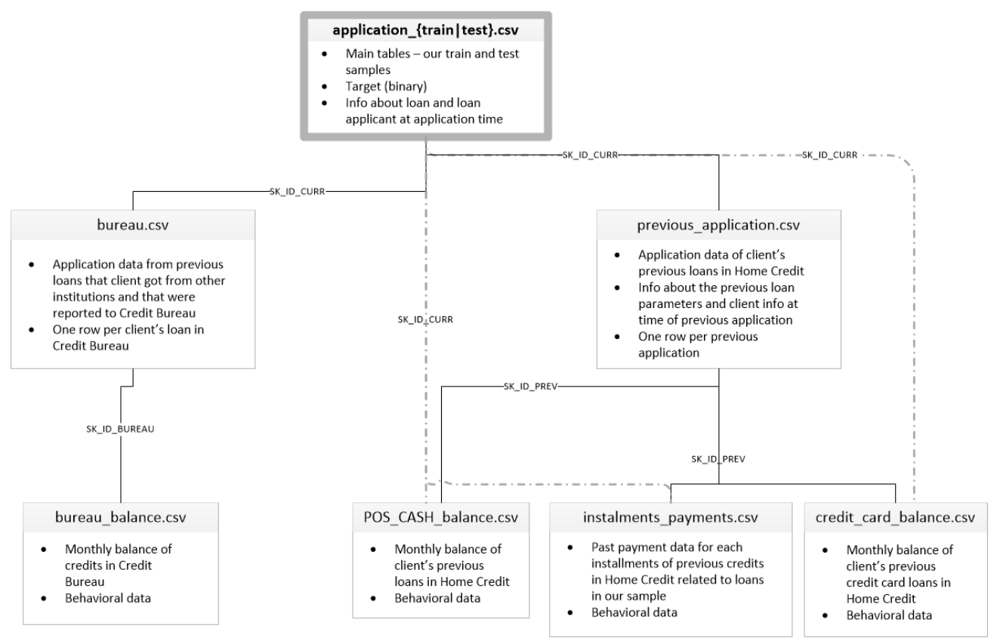

This data is provided by Home Credit Indonesia, includes 7 different sources:
1. **application_{train|test}.csv:**
   - Main table for loan applications, split into Train (with TARGET) and Test (without TARGET).
   - Static data for all applications, with each row representing one loan.  
2. **bureau.csv:**
   - Records client's previous credits from other financial institutions reported to the Credit Bureau.
   - Multiple rows per loan, corresponding to the number of credits the client had before the application date.
3. **bureau_balance.csv:**
   - Monthly balances of previous credits reported to the Credit Bureau.
   - One row for each month of history for every previous credit, resulting in (#loans * #credits * #months with observable history) rows.
4. **POS_CASH_balance.csv:**
   - Monthly balance snapshots of previous POS and cash loans with Home Credit.
   - One row for each month of history for every previous credit in Home Credit related to loans in our sample.
5. **credit_card_balance.csv:**
   - Monthly balance snapshots of previous credit cards with Home Credit.
   - One row for each month of history for every previous credit in Home Credit related to loans in our sample.
6. **previous_application.csv:**
   - Records all previous applications for Home Credit loans from clients with loans in our sample.
   - One row for each previous application related to loans in our data sample.
7. **installments_payments.csv:**
   - Repayment history for previously disbursed credits in Home Credit related to loans in our sample.
   - One row for every payment made and one for each missed payment, equivalent to one payment of one installment or one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.
   
```
Not all data will be utilized in this project, as specific columns from each table have been selected based on their perceived influence on the target. The joining process is executed using PostgreSQL and is applied to both the training and test data sets.
```

In [1]:
# Import Libraries

import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import math

from scipy.stats import yeojohnson

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.utils import resample

from sklearn.feature_selection import f_classif
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score, precision_score, roc_auc_score, roc_curve

import warnings
warnings.filterwarnings("ignore")

pd.set_option('float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

sns.set(rc={'figure.figsize':(15, 8)})
sns.set_style("whitegrid")

In [2]:
# Load the training dataset
train_df = pd.read_csv('train_dataset.csv')

In [3]:
# Check the contents of the training dataset
train_df.sample(5)

,sk_id_curr,target,name_contract_type_curr,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,amt_credit_curr,amt_annuity_curr,amt_goods_price_curr,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,days_registration,days_id_publish,occupation_type,cnt_fam_members,region_rating_client,organization_type,ext_source_1,ext_source_2,ext_source_3,days_last_phone_change,credit_bureau_active,avg_credit_day_overdue,days_credit_enddate,avg_amt_credit_max_overdue,avg_credit_prolong,avg_credit_sum,avg_amt_credit_sum_debt,avg_amt_credit_sum_limit,avg_amt_credit_sum_overdue,credit_type,days_credit_update,amt_annuity_cb,months_balance_cb,status_cb,name_contract_type_prev,avg_amt_annuity_prev,avg_down_payment_prev,avg_amt_goods_price_prev,name_contract_status_prev,code_reject_reason_prev,name_portfolio_prev,num_instalment_version,num_instalment_number,days_instalment,days_entry_payment,avg_amt_instalment,avg_amt_payment,months_balance_pos,cnt_instalment_future,name_contract_status_pos,sk_dpd_pos,sk_dpd_def_pos,months_balance_cc,amt_balance_cc,amt_credit_actual_cc,avg_amt_drawings_current,avg_amt_drawings_pos_current,amt_inst_min_regularity,amt_payment_current,amt_receivable_principal,amt_total_receivable,cnt_instalment_mature_cum,name_contract_status_cc,sk_dpd_cc,sk_dpd_def_cc
212415,346159,0,Cash loans,F,N,Y,0,121500.00,675000.00,36747.00,675000.00,Working,Secondary / secondary special,Married,Office apartment,-21680,-6753,-4901.00,-4923,Cleaning staff,2.00,2,Business Entity Type 3,NaN,0.49,0.61,-543.00,Closed,1.75,-2473.00,4601.51,0.00,151067.18,36425.29,0.00,0.91,Consumer credit,-1729.00,9513.00,-29.00,C,Revolving loans,23521.19,NaN,382500.00,Approved,XAP,Cards,1.00,9.00,-302.00,-303.00,24593.73,24593.73,-12.00,0.00,Active,0.00,0.00,-12.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
287431,432942,0,Cash loans,F,N,Y,0,225000.00,1190340.00,63549.00,1125000.00,Working,Secondary / secondary special,Single / not married,House / apartment,-20302,-10259,-9007.00,-3809,Medicine staff,1.00,1,Medicine,NaN,0.63,0.45,-668.00,Closed,0.00,-265.00,NaN,0.00,660738.35,0.00,NaN,0.00,Consumer credit,-259.00,33210.00,-16.00,0,Consumer loans,23503.03,0.00,130729.50,Approved,XAP,POS,1.00,3.50,-562.00,-567.00,23995.21,23995.21,-19.00,0.00,Active,0.00,0.00,-19.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
268564,411231,0,Cash loans,F,N,Y,0,180000.00,595903.50,27742.50,481500.00,Working,Secondary / secondary special,Married,House / apartment,-20858,-2692,-6177.00,-966,Laborers,2.00,2,Construction,0.66,0.71,0.28,-768.00,Active,0.00,777.00,NaN,0.00,351000.00,202785.00,0.00,0.00,Credit card,-81.00,7537.50,-10.00,0,Cash loans,23331.95,0.00,269326.50,Refused,HC,Cash,4.00,1.00,-737.00,-752.00,62493.27,107493.27,-24.00,0.00,Active,0.00,0.00,-24.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
194023,324980,0,Cash loans,M,Y,Y,0,135000.00,439740.00,21154.50,315000.00,Working,Secondary / secondary special,Married,House / apartment,-14693,-3272,-5843.00,-4773,NaN,2.00,2,Industry: type 5,0.36,0.41,0.51,-1491.00,Closed,0.00,-2552.00,4461.91,0.00,495723.84,0.00,0.00,0.00,Consumer credit,-2552.00,51489.00,-29.50,0,Consumer loans,12002.92,0.00,164989.80,Approved,XAP,POS,2.00,8.00,-767.00,-795.00,18225.13,14420.39,-26.00,0.00,Active,0.00,0.00,-26.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
166606,293144,0,Cash loans,M,N,N,0,135000.00,526491.00,28692.00,454500.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-19514,-5646,-5684.00,-3053,Laborers,2.00,2,Industry: type 7,0.18,0.48,0.57,-967.00,Closed,0.00,-2237.00,0.00,0.00,44820.00,0.00,0.00,0.00,Consumer credit,-2267.00,NaN,-42.50,C,Cash loans,12044.34,NaN,112500.00,Approved,XAP,Cash,1.00,12.50,-592.00,-598.50,12016.42,12016.42,-20.00,0.00,Active,0.00,0.00,-20.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Load the full dataset
full_df = pd.read_csv('train_dataset.csv')

In [4]:
# Load the testing dataset 
df_test = pd.read_csv('test_dataset.csv')

In [5]:
# Check the contents of the testing dataset
df_test.sample(5)

,sk_id_curr,name_contract_type_curr,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,amt_credit_curr,amt_annuity_curr,amt_goods_price_curr,name_income_type,name_education_type,name_family_status,name_housing_type,days_birth,days_employed,days_registration,days_id_publish,occupation_type,cnt_fam_members,region_rating_client,organization_type,ext_source_1,ext_source_2,ext_source_3,days_last_phone_change,credit_bureau_active,avg_credit_day_overdue,days_credit_enddate,avg_amt_credit_max_overdue,avg_credit_prolong,avg_credit_sum,avg_amt_credit_sum_debt,avg_amt_credit_sum_limit,avg_amt_credit_sum_overdue,credit_type,days_credit_update,amt_annuity_cb,months_balance_cb,status_cb,name_contract_type_prev,avg_amt_annuity_prev,avg_down_payment_prev,avg_amt_goods_price_prev,name_contract_status_prev,code_reject_reason_prev,name_portfolio_prev,num_instalment_version,num_instalment_number,days_instalment,days_entry_payment,avg_amt_instalment,avg_amt_payment,months_balance_pos,cnt_instalment_future,name_contract_status_pos,sk_dpd_pos,sk_dpd_def_pos,months_balance_cc,amt_balance_cc,amt_credit_actual_cc,avg_amt_drawings_current,avg_amt_drawings_pos_current,amt_inst_min_regularity,amt_payment_current,amt_receivable_principal,amt_total_receivable,cnt_instalment_mature_cum,name_contract_status_cc,sk_dpd_cc,sk_dpd_def_cc
41131,402417,Cash loans,F,N,N,0,198000.00,345510.00,17770.50,247500.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-16145,-3332,-2401.00,-4535,Managers,2.00,2,Business Entity Type 3,NaN,0.66,0.82,-123.00,Closed,0.00,-1873.00,10921.50,0.00,201189.00,0.00,0.00,0.00,Consumer credit,-1192.00,78349.50,-30.50,C,Cash loans,27017.61,6300.00,512082.00,Approved,XAP,Cards,1.00,23.00,-589.00,-600.00,21709.17,21314.72,-25.50,0.00,Active,0.00,0.00,-25.50,347916.97,450000.00,16043.17,2802.26,18475.29,670950.00,217771.15,221386.05,32.00,Active,0.00,0.00
17802,228933,Cash loans,F,N,N,0,112500.00,225000.00,23184.00,225000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-18820,-2474,-2332.00,-2332,Managers,2.00,2,Kindergarten,NaN,0.63,0.38,-1785.00,Closed,0.00,-1833.00,14112.24,0.00,755481.08,72335.83,0.00,0.00,Consumer credit,-1891.00,0.00,-24.00,C,Consumer loans,19666.92,4396.45,231211.20,Approved,XAP,POS,3.00,5.00,-1088.00,-1091.00,39864.70,39350.83,-36.00,0.00,Active,0.00,0.00,-36.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16329,217772,Cash loans,M,Y,N,0,135000.00,203301.00,20961.00,175500.00,Working,Secondary / secondary special,Single / not married,With parents,-12321,-311,-6298.00,-4294,Drivers,1.00,2,Transport: type 3,0.19,0.64,0.68,0.00,Closed,0.00,-1665.00,0.00,0.00,253674.88,1687.26,0.00,0.00,Consumer credit,-1711.00,0.00,-24.00,C,Consumer loans,8101.08,2968.50,35629.50,Approved,XAP,POS,1.00,3.00,-219.00,-229.00,7975.35,7975.35,-8.00,0.00,Active,0.00,0.00,-8.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34209,349778,Cash loans,F,Y,N,0,112500.00,685386.00,43933.50,585000.00,Working,Secondary / secondary special,Married,House / apartment,-11557,-3058,-2808.00,-2801,Sales staff,2.00,3,Self-employed,0.23,0.22,0.72,-2617.00,Closed,0.00,-1122.00,0.00,0.00,314849.28,34731.52,0.00,0.00,Consumer credit,-1148.00,15430.50,-14.00,0,Consumer loans,8160.60,8503.50,96018.00,Approved,XAP,POS,1.00,19.00,-695.00,-695.00,6925.52,6156.25,-37.50,0.00,Active,19.00,0.00,-37.50,174263.93,193378.38,13295.71,5694.35,8808.65,400839.61,53464.50,53915.04,36.00,Active,8.00,0.00
12748,192789,Cash loans,F,N,Y,0,81000.00,135000.00,12379.50,135000.00,Commercial associate,Secondary / secondary special,Married,House / apartment,-10364,-1464,-1513.00,-736,Laborers,2.00,2,Business Entity Type 3,0.48,0.33,0.27,-606.00,Closed,0.00,-604.00,0.00,0.00,49297.03,4609.66,0.00,0.00,Consumer credit,-641.00,0.00,-8.00,C,Consumer loans,4457.27,2913.00,43736.40,Approved,XAP,POS,2.00,4.50,-458.50,-469.00,7660.37,7660.37,-16.00,0.00,Active,0.00,0.00,-16.00,0.00,87000.00,0.00,NaN,0.00,NaN,0.00,

#### Description of Each Column:
1. sk_id_curr: ID of loan in our sample	
2. target: Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)	
3. name_contract_type_curr: Identification if loan is cash or revolving	
4. code_gender: Gender of the client
5. flag_own_car: Flag if the client owns a car
6. flag_own_realty: Flag if client owns a house or flat
7. cnt_children: Number of children the client has
8. amt_income_total: Income of the client
9. amt_credit_curr: Current credit amount of the loan
10. amt_annuity_curr: Current loan annuity
11. amt_goods_price_curr: For consumer loans it is the price of the goods for which the loan is given
12. name_income_type: Clients income type (businessman, working, maternity leave,…)	
13. name_education_type: Level of highest education the client achieved
14. name_family_status: Family status of the client	
15. name_housing_type: What is the housing situation of the client (renting, living with parents, ...)	
16. days_birth: Client's age in days at the time of application	
17. days_employed: How many days before the application the person started current employment	
18. days_registration: How many days before the application did client change his registration	
19. days_id_publish: How many days before the application did client change the identity document with which he applied for the loan	
20. occupation_type: What kind of occupation does the client have	
21. cnt_fam_members: How many family members does client have	
22. region_rating_client: Our rating of the region where client lives (1,2,3)	
23. organization_type: Type of organization where client works
24. ext_source_1: Normalized score from external data source	
25. ext_source_2: Normalized score from external data source	
26. ext_source_3: Normalized score from external data source	
27. days_last_phone_change: How many days before application did client change phone	
28. credit_bureau_active: Status of the Credit Bureau (CB) reported credits	
29. avg_credit_day_overdue: Average of days past due on CB credit at the time of application for related loan in our sample	
30. days_credit_enddate: Remaining duration of CB credit (in days) at the time of application in Home Credit	
31. avg_amt_credit_max_overdue: Average of maximal amount overdue on the Credit Bureau credit so far (at application date of loan in our sample)	
32. avg_credit_prolong: How many average times was the Credit Bureau credit prolonged	
33. avg_credit_sum: Average of current credit amount for the Credit Bureau credit	
34. avg_amt_credit_sum_debt: Average of current debt on Credit Bureau credit	
35. avg_amt_credit_sum_limit: Average of current credit limit of credit card reported in Credit Bureau	
36. avg_amt_credit_sum_overdue: Average of current amount overdue on Credit Bureau credit	
37. credit_type: Type of Credit Bureau credit (Car, cash,...)	
38. days_credit_update: How many days before loan application did last information about the Credit Bureau credit come	
39. amt_annuity_cb: Annuity of the Credit Bureau credit	
40. months_balance_cb: Month of balance relative to application date (-1 means the freshest balance date)	
41. status_cb: Status of Credit Bureau loan during the month (active, closed, DPD0-30,… [C means closed, X means status unknown, 0 means no DPD, 1 means maximal did during month between 1-30, 2 means DPD 31-60,… 5 means DPD 120+ or sold or written off ])	
42. name_contract_type_prev: Contract product type in previous (Cash loan, consumer loan [POS] ,...) of the previous application
43. avg_amt_annuity_prev: Average of annuity of previous application	
44. avg_down_payment_prev: Average of down payment on the previous application	
45. avg_amt_goods_price_prev: Average of goods price of good that client asked for (if applicable) on the previous application	
46. name_contract_status_prev: Contract status (approved, cancelled, ...) of previous application	
47. code_reject_reason_prev: Why was the previous application rejected	
48. name_portfolio_prev: Was the previous application for CASH, POS, CAR, …	
49. num_instalment_version: Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed	
50. num_instalment_number: On which installment we observe payment	
51. days_instalment: When the installment of previous credit was supposed to be paid (relative to application date of current loan)	
52. days_entry_payment: When was the installments of previous credit paid actually (relative to application date of current loan)	
53. avg_amt_instalment: What was the prescribed installment amount of previous credit on this installment	
54. avg_amt_payment: What the client actually paid on previous credit on this installment	
55. months_balance_pos: Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly)	
56. cnt_instalment_future: Installments left to pay on the previous credit	
57. name_contract_status_pos: Contract status during the month	
58. sk_dpd_pos: DPD (days past due) during the month of previous credit	
59. sk_dpd_def_pos: DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit	
60. months_balance_cc: Month of balance relative to application date (-1 means the freshest balance date)	
61. amt_balance_cc: Balance during the month of previous credit	
62. amt_credit_actual_cc: Credit card limit during the month of the previous credit 	
63. avg_amt_drawings_current: Average of amount drawing during the month of the previous credit	
64. avg_amt_drawings_pos_current: Average of amount drawing or buying goods during the month of the previous credit	
65. amt_inst_min_regularity: Minimal installment for this month of the previous credit	
66. amt_payment_current: How much did the client pay during the month on the previous credit	
67. amt_receivable_principal: Amount receivable for principal on the previous credit	
68. amt_total_receivable: Total amount receivable on the previous credit	
69. cnt_instalment_mature_cum: Number of paid installments on the previous credit	
70. name_contract_status_cc: Contract status (active signed,...) on the previous credit	
71. sk_dpd_cc: DPD (Days past due) during the month on the previous credit	
72. sk_dpd_def_cc: DPD (Days past due) during the month with tolerance (debts with low loan amounts are ignored) of the previous credit

## Exploratory Data Analysis

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 72 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   sk_id_curr                    307511 non-null  int64  
 1   target                        307511 non-null  int64  
 2   name_contract_type_curr       307511 non-null  object 
 3   code_gender                   307511 non-null  object 
 4   flag_own_car                  307511 non-null  object 
 5   flag_own_realty               307511 non-null  object 
 6   cnt_children                  307511 non-null  int64  
 7   amt_income_total              307511 non-null  float64
 8   amt_credit_curr               307511 non-null  float64
 9   amt_annuity_curr              307499 non-null  float64
 10  amt_goods_price_curr          307233 non-null  float64
 11  name_income_type              307511 non-null  object 
 12  name_education_type           307511 non-nul

In [17]:
# Check the dataset with missing values >=50% from the total
train_df.isnull().sum()[train_df.isnull().sum() >= 153755]

ext_source_1                    173378
amt_annuity_cb                  227502
months_balance_cb               215280
status_cb                       215280
amt_balance_cc                  220606
amt_credit_actual_cc            220606
avg_amt_drawings_current        220606
avg_amt_drawings_pos_current    246371
amt_inst_min_regularity         220606
amt_payment_current             246451
amt_receivable_principal        220606
amt_total_receivable            220606
cnt_instalment_mature_cum       220606
name_contract_status_cc         220606
sk_dpd_cc                       220606
sk_dpd_def_cc                   220606
dtype: int64

**Summary:**
- The training dataset comprises 72 columns and 307,511 rows.
- Missing values are observed in several columns. For the columns `ext_source_1`, `amt_annuity_cb`, `months_balance_cb`, `status_cb`, `amt_balance_cc`, `amt_credit_actual_cc`, `avg_amt_drawings_current`, `avg_amt_drawings_pos_current`, `amt_inst_min_regularity`, `amt_payment_current`, `amt_receivable_principal`, `amt_total_receivable`, `cnt_instalment_mature_cum`, `name_contract_status_cc`, `sk_dpd_cc`, `sk_dpd_def_cc`, missing values account for >50% of the total rows. 
> Consequently, these columns will be dropped during preprocessing to avoid introducing bias.

### Statistical Analysis

In [4]:
# Separate categorical and numerical columns
num_cols = []
cat_cols = []

for a, i in train_df.items():
    if i.dtype == 'object':
        cat_cols.append(a)
    else:
        num_cols.append(a)

#### Categorical Summaries

In [11]:
train_df[cat_cols].describe().T

,count,unique,top,freq
name_contract_type_curr,307511,2,Cash loans,278232
code_gender,307511,3,F,202448
flag_own_car,307511,2,N,202924
flag_own_realty,307511,2,Y,213312
name_income_type,307511,8,Working,158774
name_education_type,307511,5,Secondary / secondary special,218391
name_family_status,307511,6,Married,196432
name_housing_type,307511,6,House / apartment,272868
occupation_type,211120,18,Laborers,55186
organization_type,307511,58,Business Entity Type 3,67992


**Summary:**
- Cash loans are more preferred than revolving loans. However, there is a difference between the current and previous contract types, where the most popular consumer loans in the previous contracts are not available in the current contracts.
- More clients applying for loans are female compared to males.
- A higher number of clients do not own a car but possess a house or flat.
> Over 80% of clients already own a house/apartment.
- Half of the total clients generate income through working, while others derive income from other activities.
- The education level of clients applying for loans is predominantly secondary/secondary special.
- Half of the total clients have a marital status of married, while others have different statuses.
- Occupation type is dominated by laborers, indicating that the majority of clients choose jobs with general skills rather than highly specific ones.
- Organization type is predominantly business entities.
- Consumer credit is the most preferred credit type among clients compared to other credit types.
- The status of the Credit Bureau (CB) is dominated by closed, indicating that their credit has been closed or completed.
- On average, clients have most frequent approved as their contract status, indicating that the majority of clients have a fairly good record.
- The most common code_reject_reason is XAP, suggesting that XAP is a code indicating clients who are not rejected because the majority of contract statuses for clients are approved.
- The portfolio or application loans previously were dominated by POS.
- Contract statuses for both pos cash and credit card are equally dominated by Active, indicating that the contract statuses during the month and on the previous credit are still active.

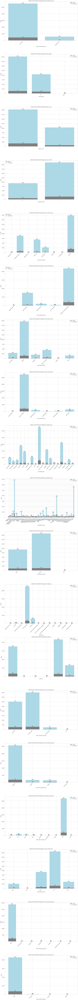

In [5]:
"""
Analysis of categorical columns involves examining the relationship between individual categorical 
features and the target variable. (Bivariate Analysis)
"""

plt.figure(figsize=(15, 190))
for i in range(0, len(cat_cols)):
    plt.subplot(19, 1, i + 1)
    
    count_by_cat = train_df[cat_cols[i]].value_counts()
    
    customer_status = train_df.groupby([cat_cols[i], 'target']).size().unstack().fillna(0)
    
    customer_status['default_percentage'] = (customer_status[1] / (customer_status[0] + customer_status[1])) * 100
    customer_status['non_default_percentage'] = (customer_status[0] / (customer_status[0] + customer_status[1])) * 100
    
    plt.bar(customer_status.index, customer_status[1], color='grey', label='Default')
    plt.bar(customer_status.index, customer_status[0], bottom=customer_status[1], color='lightblue', label='Non-Default')
    
    for j, (default_percentage, non_default_percentage) in enumerate(zip(customer_status['default_percentage'], customer_status['non_default_percentage'])):
        plt.text(j, customer_status[1][j], f'{default_percentage:.0f}%', ha='center', va='bottom', color='black')
        plt.text(j, customer_status[0][j] + customer_status[1][j], f'{non_default_percentage:.0f}%', ha='center', va='bottom', color='black')

    plt.xticks(range(len(customer_status.index)), customer_status.index, rotation=45, ha="right")
    plt.xlabel(cat_cols[i])
    plt.ylabel('Count')
    plt.title(f'Default and Non-Default Percentage by {cat_cols[i]}')
    plt.legend()

plt.tight_layout()
plt.show()

**Summary:**
- Although cash loans have a larger number of clients compared to revolving loans, the default rate for cash loans is also higher. In contrast to the current contract's default rate, which is highest for cash loans, the previous contract had the highest default rate for revolving loans, even though revolving loans had the fewest clients. It can also be observed that the existence of consumer loans in the previous contract looks quite favorable because it attracted the most interest but had the lowest default rate. Therefore, it can be concluded that in the current contract, the high default rate is proportional to the number of clients, while in the previous contract, the default rate is inversely proportional to the number of clients. The fewer clients choosing a specific contract type, the higher its default rate, and vice versa.
- Female clients outnumber male clients, but male clients have a higher default rate than females.
- Although clients without a car outnumber those with a car, the default rate for clients without a car is also higher.
- Students and businessmen do not have any clients experiencing payment difficulties, while clients on maternity leave and unemployed have a relatively high default rate, reaching 40% of the total clients in these categories.
- Clients with a lower secondary education level have a higher default rate compared to those with different education levels.
- Civil marriage and single/not married status correlate with a higher default rate than other statuses.
- Housing types such as rented apartments and living with parents are associated with a higher default rate. The high default rate may be due to financial responsibilities for supporting family members at home or rental expenses.
- Low-skill laborers demonstrate a higher default rate compared to other occupation types.
- An active credit bureau status is linked to a higher default rate, contrasting with clients with a closed credit bureau status.
- Certain credit types, including Cash loan (non-earmarked), Loan for the purchase of equipment, Loan for working capital replenishment, and Real estate loan, exhibit no instances of payment difficulties. The highest default rate is observed for the credit type Microloan.
- Credit bureau status 3 (DPD 61-90) is not associated with payment difficulties, in contrast to status 1 (maximal did during the month between 1-30).
- The highest default rate in the previous loan is observed for the name contract status refused.
- In the previous loan, the most common reason for rejection is SCOFR.
- The highest default rate in the previous loan is found among applicants with an application for cards.
- Applicants with a contract status during the month of Approved face no payment difficulties, while those with a contract status during the month of Amortized debt exhibit the highest default rate.
- The highest default rate is associated with a contract status of Demand on the previous credit.
- In other columns, no differences in default rates between categories were found.

#### Numerical Summaries

In [12]:
train_df[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
sk_id_curr,307511.00,278180.52,102790.18,100002.00,189145.50,278202.00,367142.50,456255.00
target,307511.00,0.08,0.27,0.00,0.00,0.00,0.00,1.00
cnt_children,307511.00,0.42,0.72,0.00,0.00,0.00,1.00,19.00
amt_income_total,307511.00,168797.92,237123.15,25650.00,112500.00,147150.00,202500.00,117000000.00
amt_credit_curr,307511.00,599026.00,402490.78,45000.00,270000.00,513531.00,808650.00,4050000.00
amt_annuity_curr,307499.00,27108.57,14493.74,1615.50,16524.00,24903.00,34596.00,258025.50
amt_goods_price_curr,307233.00,538396.21,369446.46,40500.00,238500.00,450000.00,679500.00,4050000.00
days_birth,307511.00,-16037.00,4363.99,-25229.00,-19682.00,-15750.00,-12413.00,-7489.00
days_employed,307511.00,63815.05,141275.77,-17912.00,-2760.00,-1213.00,-289.00,365243.00
days_registration,307511.00,-4986.12,3522.89,-24672.00,-7479.50,-4504.00,-2010.00,0.00


**Summary:**
- The column `days_birth` has negative values as it represents the number of days that have passed since the client's birth.
- Negative values in the `days_employed` column indicate the duration of the client's employment that has already elapsed, while positive values suggest that the client started working after applying for the loan.
- Clients with negative values in the columns `days_registration`, `days_id_publish`, and `days_last_phone_change` indicate that on certain days before, clients made changes to their registration, identity document, or phone, respectively. A value of 0 indicates no changes.
- Negative values in the `days_credit_enddate` column indicate that the duration of the Credit Bureau credit (in days) at the time of application in Home Credit has ended, while positive values indicate that it has not yet ended.
- The average of the maximal amount overdue on the Credit Bureau credit so far varies from 0 to 115,987,185.00.
- The average times the Credit Bureau credit was prolonged is predominantly 0, indicating that the majority of clients did not extend their credit with the credit bureau.
- Some clients have average values of 0 for the current credit amount or annuity of the Credit Bureau credit, suggesting that these clients did not obtain credit through the credit bureau.
- Clients with positive values for the average of the current debt on the Credit Bureau credit are assumed to still have outstanding debts, while clients with negative values indicate that the recorded debt has been settled.
- Clients with positive values for the average of the current credit limit of the credit card reported in the Credit Bureau are assumed to have an available and unused limit, while negative values suggest that the available limit has been used.
- The average of the current amount overdue on the Credit Bureau credit is predominantly 0, indicating that most clients do not have overdue credit. However, there are also clients with an average overdue amount reaching 1,617,403.50.
- Negative values in the `days_credit_update` column indicate that information about the Credit Bureau credit was updated before the loan application, while positive values indicate that the information was updated after the loan application.
- An average of 0 for the annuity of the previous application suggests that the related client has never used credit services before.
- Negative values for the average of the down payment on the previous application may indicate an underpayment, positive values may suggest an overpayment, while a value of 0 indicates no down payment.
- Installments left to pay on the previous credit is predominantly 0, indicating that there are no remaining installments to be paid on the previous credit, although some clients have values reaching 60.00.
- DPD (days past due) during the month of the previous credit and DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit are predominantly 0, indicating no payment delays on the previous credit.
- The credit card limit during the month of the previous credit for clients has relatively high values, i.e., >82840.91, although there are also instances with a value of 0.
- Positive values in `amt_receivable_principal` and `amt_total_receivable` indicate outstanding debts, while negative values suggest that the debts have been settled.
- Values in other columns appear to be consistent.

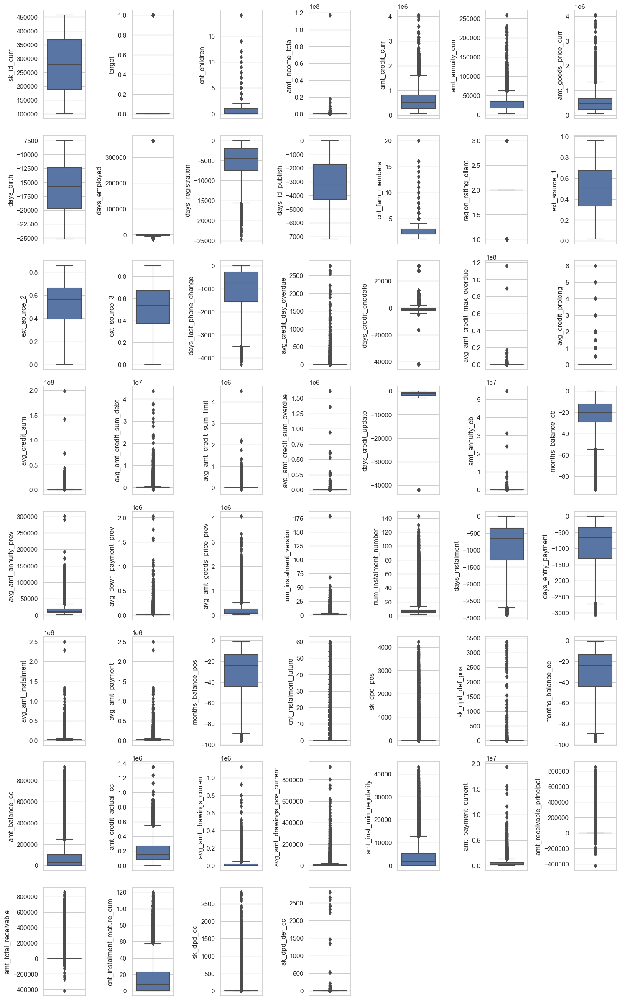

In [6]:
plt.figure(figsize=(15, 48))
for i in range(0, len(num_cols)):
    plt.subplot(16, 7, i+1)
    sns.boxplot(y=train_df[num_cols[i]], orient='v')
    plt.tight_layout()

**Summary:**
- Almost all numeric columns in the dataset exhibit outliers, with the exceptions being `sk_id_curr`, `days_birth`, `days_id_publish`, `ext_source_1`, `ext_source_2`, and `ext_source_3`.

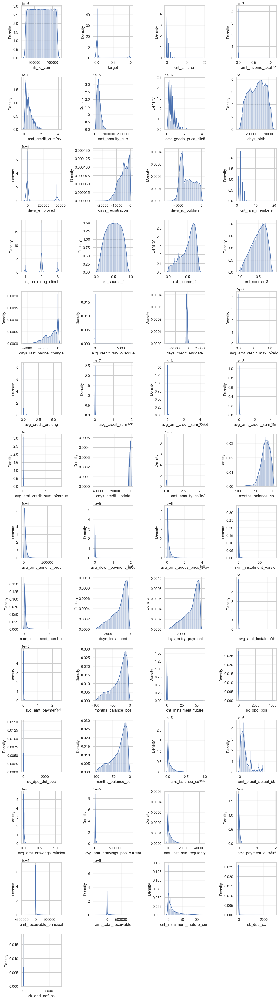

In [7]:
plt.figure(figsize=(12, 45))
for i in range(0, len(num_cols)):
    plt.subplot(15, 4, i+1)
    sns.distplot(train_df[num_cols[i]])
    plt.tight_layout()

**Summary:**
- All numeric data tends to be skewed, with only `sk_id_curr` and `ext_source_1` following a normal distribution.

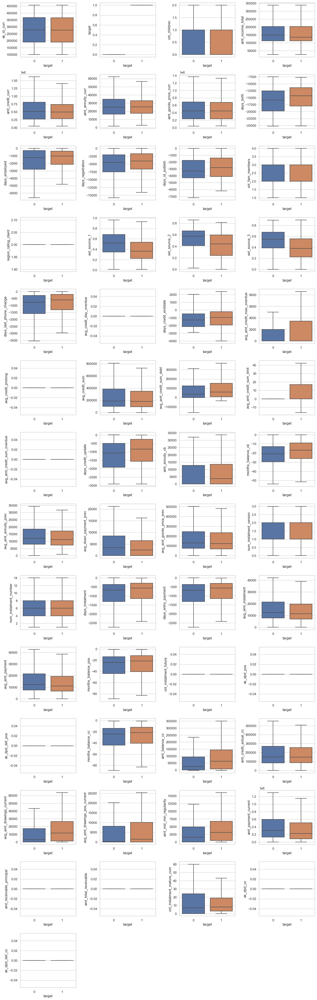

In [10]:
"""
Analysis of numerical columns involves examining the relationship between individual categorical 
features and the target variable. (Bivariate Analysis)
"""

plt.figure(figsize=(15, 90))
for i in range(0, len(num_cols)):
    plt.subplot(27, 4, i+1)
    sns.boxplot(y = train_df[num_cols[i]], x = train_df['target'], orient='v', showfliers = False)
    plt.tight_layout()

**Summary:**
- Exhibiting smaller current credit amounts and annuities, clients tend to face difficulties in making payments.
- Younger individuals may encounter challenges in payment compared to their more mature counterparts.
- Those with shorter employment tenures and recent changes in registration, identity documents, and phone details may experience difficulties in meeting payment obligations.
- A lower external score is indicative of a higher likelihood of payment challenges.
- Individuals with a more recent average of days past due on CB credit at the time of application for the related loan in our sample are prone to facing payment difficulties.
- Experiencing higher averages of the maximal amount overdue on the Credit Bureau credit so far, lower averages of the current credit amount for the Credit Bureau credit, and higher averages of the current debt on Credit Bureau credit, clients may find it challenging to meet their payment obligations.
- The variation in the average of the current credit limit of the credit card reported in the Credit Bureau, ranging from negative to positive values, indicates an increased likelihood of payment difficulties, whereas clients with a value of 0 are less likely to face payment challenges.
- Those who recently updated information about the Credit Bureau credit are more likely to experience -payment difficulties.
- A higher annuity of the Credit Bureau credit, a month of balance relative to the application date (freshest balance date), lower averages of the annuity of the previous application, and lower averages of the down payment on the previous application contribute to an increased likelihood of payment failures.
- Clients with lower goods prices of goods that clients asked for (if applicable) on the previous application are more likely to face payment difficulties.
- Those who actually paid less on the previous credit, experienced higher balances during the month of the previous credit, and had lower credit card limits during the month of the previous credit are more likely to experience payment difficulties.
- Higher averages of the amount drawing during the month of the previous credit, amount drawing or buying goods during the month of the previous credit, and minimal installments for this month of the previous credit indicate an increased likelihood of payment difficulties.
- The less the client pays during the month on the previous credit and the fewer the number of paid installments on the previous credit, the more likely clients are to experience payment difficulties. 
- Meanwhile, in other columns, there are no significant differences between clients experiencing payment difficulties and those not experiencing payment difficulties.

### Business Insight

#### The Distribution of Customers Loan Status

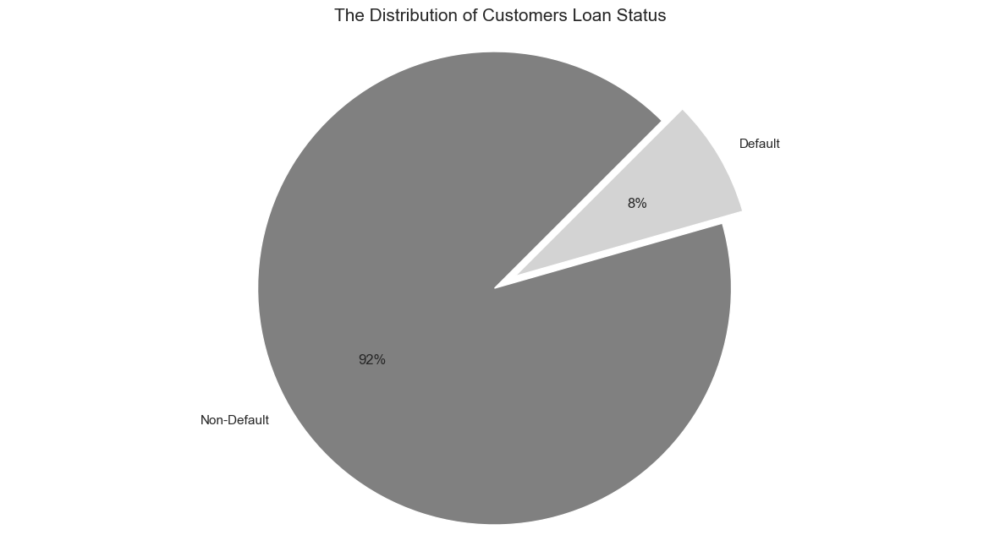

In [11]:
target_counts = train_df['target'].value_counts()
colors = ['grey', 'lightgrey']
explode = (0.1, 0)

plt.pie(target_counts, labels=['Non-Default', 'Default'], colors=colors, autopct='%1.0f%%', startangle=45, explode=explode)
plt.title('The Distribution of Customers Loan Status', fontsize=15)
plt.axis('equal')
plt.show()

**Insight:**
Loan defaults are being experienced by 8% of customers.

#### Default Rate by Gender and Income

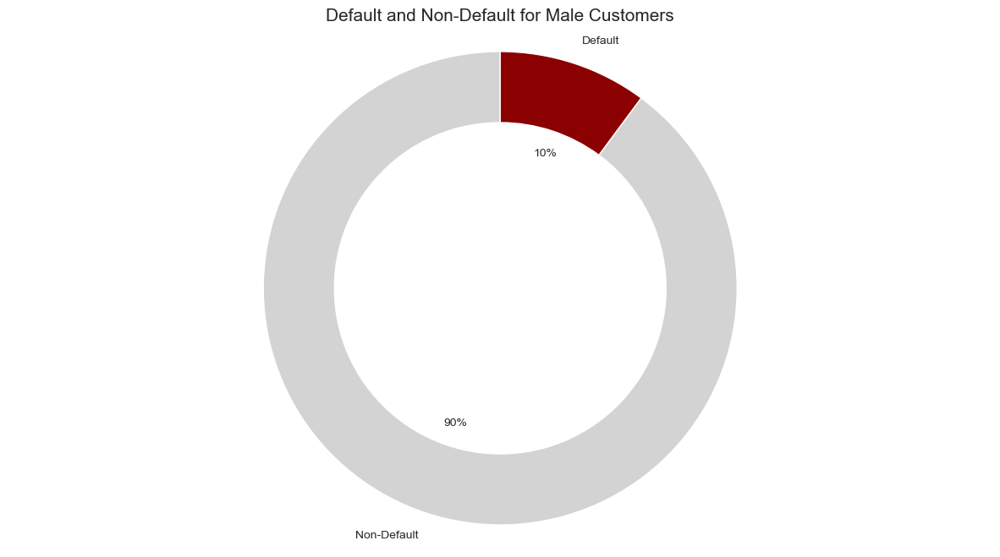

In [12]:
customer_male = train_df[train_df['code_gender'] == 'M']
target_counts = customer_male['target'].value_counts()

fig, ax = plt.subplots()
labels = ['Non-Default', 'Default']
ax.pie(target_counts, labels=labels, autopct='%1.0f%%', startangle=90,
       wedgeprops=dict(width=0.3), textprops={'fontsize': 10}, colors=['lightgrey', 'darkred'])
ax.axis('equal')  

centre_circle = plt.Circle((0, 0), 0.2, color='white', edgecolor='black', linewidth=1.25)
ax.add_artist(centre_circle)

plt.title('Default and Non-Default for Male Customers', fontsize=15)
plt.show()

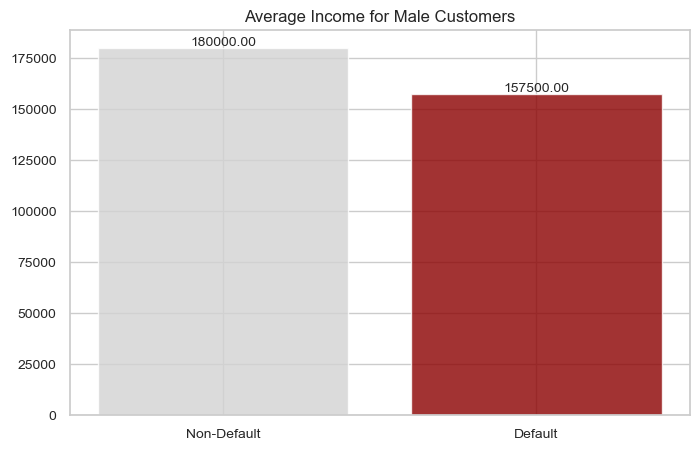

In [13]:
plt.figure(figsize=(8, 5))

customer_male = train_df[train_df['code_gender'] == 'M']

target_0 = customer_male[customer_male['target'] == 0]
target_1 = customer_male[customer_male['target'] == 1]

bar_width = 0.1
index = [0, 1]
plt.bar(index, [target_0['amt_income_total'].median(), target_1['amt_income_total'].median()],
        color=['lightgrey', 'darkred'], alpha=0.8, label='Median Amount Income')

for i, label in zip(index, [target_0['amt_income_total'].median(), target_1['amt_income_total'].median()]):
    plt.text(i, label, f'{label:.2f}', ha='center', va='bottom', fontsize=10)

#plt.ylabel('Amount Income', fontsize=12)
plt.title('Average Income for Male Customers')
plt.xticks(index, ['Non-Default', 'Default'], fontsize=10)
plt.yticks(fontsize=10)
plt.show()

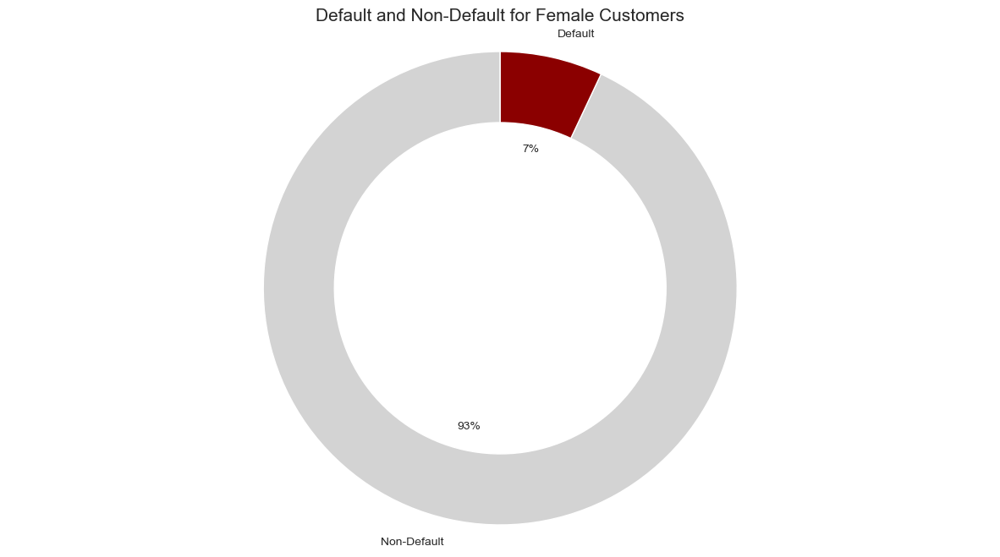

In [14]:
customer_female = train_df[train_df['code_gender'] == 'F']
target_counts = customer_female['target'].value_counts()

fig, ax = plt.subplots()
labels = ['Non-Default', 'Default']
ax.pie(target_counts, labels=labels, autopct='%1.0f%%', startangle=90,
       wedgeprops=dict(width=0.3), textprops={'fontsize': 10}, colors=['lightgrey', 'darkred'])
ax.axis('equal')  

centre_circle = plt.Circle((0, 0), 0.2, color='white', edgecolor='black', linewidth=1.25)
ax.add_artist(centre_circle)

plt.title('Default and Non-Default for Female Customers', fontsize=15)
plt.show()

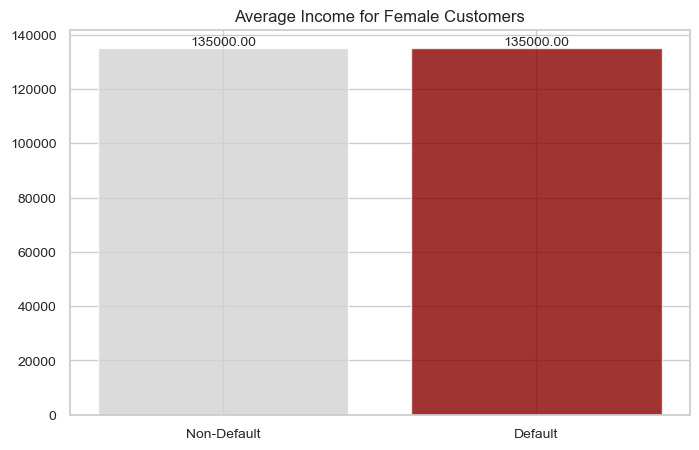

In [15]:
plt.figure(figsize=(8, 5))

customer_female = train_df[train_df['code_gender'] == 'F']

target_0 = customer_female[customer_female['target'] == 0]
target_1 = customer_female[customer_female['target'] == 1]

bar_width = 0.1
index = [0, 1]
plt.bar(index, [target_0['amt_income_total'].median(), target_1['amt_income_total'].median()],
        color=['lightgrey', 'darkred'], alpha=0.8, label='Median Amount Income')

for i, label in zip(index, [target_0['amt_income_total'].median(), target_1['amt_income_total'].median()]):
    plt.text(i, label, f'{label:.2f}', ha='center', va='bottom', fontsize=10)

#plt.ylabel('Amount Income', fontsize=12)
plt.title('Average Income for Female Customers')
plt.xticks(index, ['Non-Default', 'Default'], fontsize=10)
plt.yticks(fontsize=10)
plt.show()

**Insight:**  
Male customers have a higher default rate compared to females. Upon further analysis, it is observed that male customers facing payment difficulties tend to have a lower average income than those who do not default. In contrast, among female customers, both those experiencing payment challenges and those who do not seem to have relatively similar average incomes. This indicates that income plays a significant role in determining default tendencies for male customers, while other factors may have a more pronounced impact on female customers. 
```
As a recommendation, it may be considered that when assessing the eligibility of a loan, income becomes a crucial consideration, especially if the customer is male. If their income is high, loan approval may be considered, whereas if their income is low, the consideration to reject the loan could be made to reduce the risk of default and mitigate potential losses for the company.
```

#### The Distribution of Average Score from External Data Sources
In the analysis, only scores from external sources 2 and 3 will be utilized because the data for the score from external source 1 contains too many missing values (>50%). This is a concern as it may lead to bias if included in the analysis.

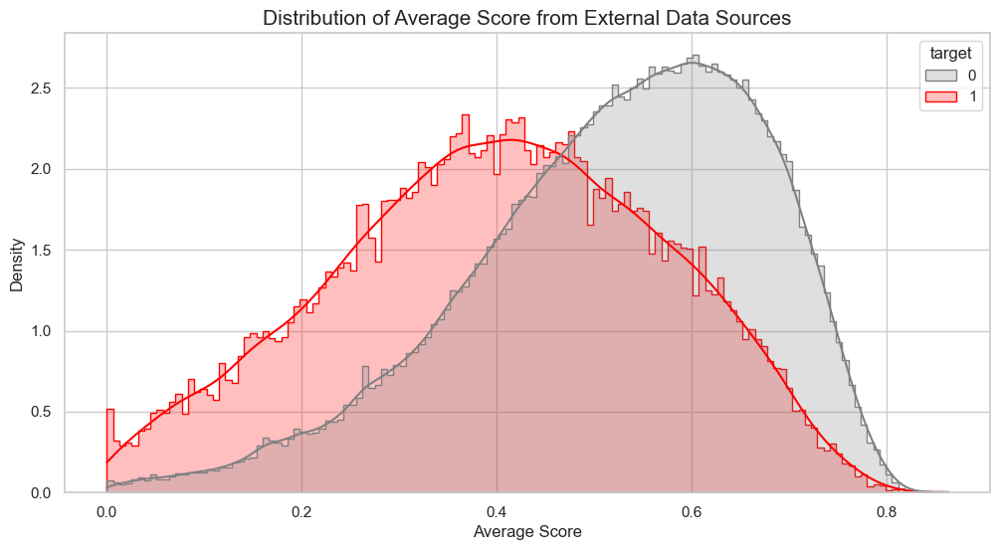

In [16]:
plt.figure(figsize=(12, 6))
train_df['avg_ext_source'] = train_df[['ext_source_2', 'ext_source_3']].mean(axis=1)
plot = sns.histplot(data=train_df, x='avg_ext_source', hue='target', element='step', common_norm=False, stat='density', kde=True,
                    palette={0: 'grey', 1: 'red'})
plt.xlabel('Average Score')
plt.ylabel('Density')
plt.title('Distribution of Average Score from External Data Sources', fontsize=15)
plt.show()

**Insight:**
Customers facing payment difficulties tend to have lower average scores from external data sources compared to those without payment difficulties.
```
As a recommendation, it is advisable to consider the external score as a crucial factor when assessing loan eligibility. If the external score is high, loan approval may be considered. Conversely, if the external score is low, rejecting the loan could be considered to minimize the risk of default and mitigate potential losses for the company.
```

**Summary:**  
The recommendations derived from exploratory data analysis are currently focused only on male clients and those with relatively low scores from external sources. However, specific recommendations for female clients and those with high scores from external sources are not available yet, even though these clients may also face payment difficulties due to other influencing factors. <b>Therefore, the creation of a machine learning model is necessary to predict more precisely and accurately for clients who may encounter payment challenges. This approach can provide insights to tailor recommendations more effectively.</b>

## Data Preprocessing

### Data Splitting
Data splitting refers to the process of dividing the dataset before applying other preprocessing steps. This is done to avoid any information leakage between the data used to build the model (training data) and the data used to validate the model (validation data). The division is executed with an <b>80:20</b> ratio between training and validation data, as this ratio has demonstrated superior performance compared to a 70:30 split. The choice of ratio may be influenced by the presence of an imbalanced class target. When only 70 data points are utilized for training, the model may not be adequately effective in predicting the target due to the imbalance in class distribution. 

In [5]:
df_train, df_val = train_test_split(train_df, test_size=0.2, stratify=train_df[['target']], random_state=42)
df_train.reset_index(drop=True, inplace=True)
df_val.reset_index(drop=True, inplace=True)

print(df_train.shape)
print(df_val.shape)

(246008, 72)
(61503, 72)


In [125]:
# df_train, df_val = train_test_split(train_df, test_size=0.3, stratify=train_df[['target']], random_state=42)
# df_train.reset_index(drop=True, inplace=True)
# df_val.reset_index(drop=True, inplace=True)
#
# print(df_train.shape)
# print(df_val.shape)

(215257, 72)
(92254, 72)


### Handle Missing Values

#### Drop Columns with Missing Values >50%
Based on the results of the previous Exploratory Data Analysis (EDA), columns such as `ext_source_1`, `amt_annuity_cb`, `months_balance_cb`, `status_cb`, `amt_balance_cc`, `amt_credit_actual_cc`, `avg_amt_drawings_current`, `avg_amt_drawings_pos_current`, `amt_inst_min_regularity`, `amt_payment_current`, `amt_receivable_principal`, `amt_total_receivable`, `cnt_instalment_mature_cum`, `name_contract_status_cc`, `sk_dpd_cc`, and `sk_dpd_def_cc` have missing values exceeding 50%. These columns will be handled by dropping them, as imputing missing values is deemed risky to introduce bias due to the substantial amount of imputed values.

In [6]:
# Drop the specified column in the dataset for modeling.
df_train.drop(['ext_source_1', 'amt_annuity_cb', 'months_balance_cb', 'status_cb', 'amt_balance_cc', 'amt_credit_actual_cc', 'avg_amt_drawings_current', 'avg_amt_drawings_pos_current', 'amt_inst_min_regularity', 'amt_payment_current', 'amt_receivable_principal', 'amt_total_receivable', 'cnt_instalment_mature_cum', 'name_contract_status_cc', 'sk_dpd_cc', 'sk_dpd_def_cc'], axis=1, inplace=True)
df_val.drop(['ext_source_1', 'amt_annuity_cb', 'months_balance_cb', 'status_cb', 'amt_balance_cc', 'amt_credit_actual_cc', 'avg_amt_drawings_current', 'avg_amt_drawings_pos_current', 'amt_inst_min_regularity', 'amt_payment_current', 'amt_receivable_principal', 'amt_total_receivable', 'cnt_instalment_mature_cum', 'name_contract_status_cc', 'sk_dpd_cc', 'sk_dpd_def_cc'], axis=1, inplace=True)

In [9]:
# Remove a column from the full dataset.
full_df.drop(['ext_source_1', 'amt_annuity_cb', 'months_balance_cb', 'status_cb', 'amt_balance_cc', 'amt_credit_actual_cc', 'avg_amt_drawings_current', 'avg_amt_drawings_pos_current', 'amt_inst_min_regularity', 'amt_payment_current', 'amt_receivable_principal', 'amt_total_receivable', 'cnt_instalment_mature_cum', 'name_contract_status_cc', 'sk_dpd_cc', 'sk_dpd_def_cc'], axis=1, inplace=True)

In [8]:
# Remove a column from the full dataset.
df_test.drop(['ext_source_1', 'amt_annuity_cb', 'months_balance_cb', 'status_cb', 'amt_balance_cc', 'amt_credit_actual_cc', 'avg_amt_drawings_current', 'avg_amt_drawings_pos_current', 'amt_inst_min_regularity', 'amt_payment_current', 'amt_receivable_principal', 'amt_total_receivable', 'cnt_instalment_mature_cum', 'name_contract_status_cc', 'sk_dpd_cc', 'sk_dpd_def_cc'], axis=1, inplace=True)

#### Imputation using SimpleImputer for Columns with Missing Values <50%
Missing values in categorical columns will be imputed using the mode (most frequent value) to preserve the dominant characteristics of the data. Meanwhile, missing values in numerical columns will be imputed using the median, as numerical columns in the dataset with missing values have a skewed distribution. Using the median as a replacement provides a better representation than the mean in situations where the distribution is skewed, as it is less sensitive to outliers and offers a more robust depiction of the central tendency.

In [10]:
# Separate categorical and numerical columns in the training dataset
train_cat = []
train_num = []

for a, i in df_train.items():
    if i.dtype == 'object':
        train_cat.append(a)
    else:
        train_num.append(a)

In [11]:
# Separate categorical and numerical columns in the validating dataset
val_cat = []
val_num = []

for a, i in df_val.items():
    if i.dtype == 'object':
        val_cat.append(a)
    else:
        val_num.append(a)

In [12]:
# Separate categorical and numerical columns in the full dataset
full_cat = []
full_num = []

for a, i in full_df.items():
    if i.dtype == 'object':
        full_cat.append(a)
    else:
        full_num.append(a)

In [13]:
# Separate categorical and numerical columns in the testing dataset
test_cat = []
test_num = []

for a, i in df_test.items():
    if i.dtype == 'object':
        test_cat.append(a)
    else:
        test_num.append(a)

In [14]:
# Impute missing values in categorical columns using mode
imput_cats = SimpleImputer(strategy='most_frequent')
df_train[train_cat] = imput_cats.fit_transform(df_train[train_cat])
df_val[val_cat] = imput_cats.fit_transform(df_val[val_cat])
full_df[full_cat] = imput_cats.fit_transform(full_df[full_cat])
df_test[test_cat] = imput_cats.fit_transform(df_test[test_cat])

# Impute missing values in numerical columns using median
imput_nums = SimpleImputer(strategy='median')
df_train[train_num] = imput_nums.fit_transform(df_train[train_num])
df_val[val_num] = imput_nums.fit_transform(df_val[val_num])
full_df[full_num] = imput_nums.fit_transform(full_df[full_num])
df_test[test_num] = imput_nums.fit_transform(df_test[test_num])

In [15]:
# Check for null values in the training dataset
null_counts = df_train.isnull().sum()
if null_counts[null_counts > 0].empty:
    print("There are no null values in the training dataset.")
else:
    print("Columns with null values and their counts:")
    print(null_counts[null_counts > 0])

There are no null values in the training dataset.


In [16]:
# Check for null values in the validating dataset
null_counts = df_val.isnull().sum()
if null_counts[null_counts > 0].empty:
    print("There are no null values in the validating dataset.")
else:
    print("Columns with null values and their counts:")
    print(null_counts[null_counts > 0])

There are no null values in the validating dataset.


In [126]:
# Check for null values in the full dataset
null_counts = full_df.isnull().sum()
if null_counts[null_counts > 0].empty:
    print("There are no null values in the full dataset.")
else:
    print("Columns with null values and their counts:")
    print(null_counts[null_counts > 0])

There are no null values in the full dataset.


In [19]:
# Check for null values in the testing dataset
null_counts = df_test.isnull().sum()
if null_counts[null_counts > 0].empty:
    print("There are no null values in the testing dataset.")
else:
    print("Columns with null values and their counts:")
    print(null_counts[null_counts > 0])

There are no null values in the testing dataset.


### Handle Duplicated Values

In [20]:
# Handling duplicated values in the training dataset
# print("Number of rows before removing duplicates:", len(df_train))
# print("Number of rows after removing duplicates:", len(df_train.drop_duplicates()))

Number of rows before removing duplicates: 246008
Number of rows after removing duplicates: 246008


In [21]:
# Handling duplicated values in the validating dataset
# print("Number of rows before removing duplicates:", len(df_val))
# print("Number of rows after removing duplicates:", len(df_val.drop_duplicates()))

Number of rows before removing duplicates: 61503
Number of rows after removing duplicates: 61503


In [22]:
# Handling duplicated values in the full dataset
# print("Number of rows before removing duplicates:", len(full_df))
# print("Number of rows after removing duplicates:", len(full_df.drop_duplicates()))

Number of rows before removing duplicates: 307511
Number of rows after removing duplicates: 307511


In [23]:
# Handling duplicated values in the testing dataset
# print("Number of rows before removing duplicates:", len(df_test))
# print("Number of rows after removing duplicates:", len(df_test.drop_duplicates()))

Number of rows before removing duplicates: 48744
Number of rows after removing duplicates: 48744


**Summary:**
The datasets contain no duplicates, so there is no need to handle duplicated values.

### Handle Invalid Values

In [46]:
# Check unique values in categorical columns

for x in df_train[train_cat].columns :
    uniq = list(df_train[x].unique())
    uniq.sort()

    print (f'Column {x}:')
    if len(uniq) > 0:
        unq = list(uniq[:])
        print (f'{uniq}')
    else:
        print (f'{uniq}')
    print("--" * 50, end='\n\n')

Column name_contract_type_curr:
['Cash loans', 'Revolving loans']
----------------------------------------------------------------------------------------------------

Column code_gender:
['F', 'M', 'XNA']
----------------------------------------------------------------------------------------------------

Column flag_own_car:
['N', 'Y']
----------------------------------------------------------------------------------------------------

Column flag_own_realty:
['N', 'Y']
----------------------------------------------------------------------------------------------------

Column name_income_type:
['Businessman', 'Commercial associate', 'Maternity leave', 'Pensioner', 'State servant', 'Student', 'Unemployed', 'Working']
----------------------------------------------------------------------------------------------------

Column name_education_type:
['Academic degree', 'Higher education', 'Incomplete higher', 'Lower secondary', 'Secondary / secondary special']
----------------------------

**Includes:**
- Replacing <b>XNA</b> data in the `code_gender` column with <b>F</b>, because XNA is assumed to denote NA values and is thus replaced with the mode.
- Simplifying categories in the `name_education_type` column, where <b>Incomplete higher, Higher education, and Academic degree are merged into Above secondary</b> as they represent education levels beyond secondary. <b>The Secondary / secondary special category is also changed to Secondary</b> for better structure and alignment with other categories.
- Simplifying categories in the `name_family_status` column for <b>Civil marriage, Separated, and Unknown, where they are combined with Married</b>. This is because clients with Civil marriage and Separated statuses are indeed in a marriage, while Unknown is considered NA and replaced with the mode.
- Simplifying categories in the `organization_type` column by <b>combining similar data into one category</b>. Additionally, <b>changing XNA data to Other</b>, assuming that clients with XNA values have organization types outside the provided options.
- <b>Changing the Unknown type of loan category to Another type of loan</b> in the `credit_type` column, assuming that these clients chose a loan other than the provided credit types.
- <b>Changing XNA category</b> in the `name_contract_type` column <b>to Consumer loans</b> because XNA is assumed to denote NA values and is thus replaced with the mode.
- <b>Changing XNA category</b> in the `name_portfolio_prev` column <b>to Other</b>, assuming that clients with XNA values in the previous application used loans for purposes other than those provided.
- <b>Rounding values in the `avg_credit_day_overdue`, `avg_credit_prolong`, `num_instalment_number`, `months_balance_pos`, and `months_balance_cc` columns as they should be in units</b>.
- <b>Changing the data type of the target column to integer</b>, because it contains binary values (0 and 1).

#### Handle Invalid Values in The Training Dataset

In [25]:
# Replacing values in the code_gender column
df_train['code_gender'] = df_train['code_gender'].replace({'XNA': 'F'})

# Replacing values in the name_education_type column
df_train['name_education_type'] = df_train['name_education_type'].replace({
    'Higher education': 'Above secondary',
    'Incomplete higher': 'Above secondary',
    'Academic degree': 'Above secondary',
    'Secondary / secondary special': 'Secondary'
})

# Replacing values in the name_family_status column
df_train['name_family_status'] = df_train['name_family_status'].replace({
    'Civil marriage': 'Married',
    'Separated': 'Married',
    'Unknown': 'Married'
})

# Replacing values in the organization_type column
df_train['organization_type'] = df_train['organization_type'].replace({
    'Business Entity Type 1': 'Business entity',
    'Business Entity Type 2': 'Business entity',
    'Business Entity Type 3': 'Business entity',
    'Trade: type 1': 'Trade',
    'Trade: type 2': 'Trade',
    'Trade: type 3': 'Trade',
    'Trade: type 4': 'Trade',
    'Trade: type 5': 'Trade',
    'Trade: type 6': 'Trade',
    'Trade: type 7': 'Trade',
    'Industry: type 1': 'Industry',
    'Industry: type 2': 'Industry',
    'Industry: type 3': 'Industry',
    'Industry: type 4': 'Industry',
    'Industry: type 5': 'Industry',
    'Industry: type 6': 'Industry',
    'Industry: type 7': 'Industry',
    'Industry: type 8': 'Industry',
    'Industry: type 9': 'Industry',
    'Industry: type 10': 'Industry',
    'Industry: type 11': 'Industry',
    'Industry: type 12': 'Industry',
    'Industry: type 13': 'Industry',
    'Transport: type 1': 'Transport',
    'Transport: type 2': 'Transport',
    'Transport: type 3': 'Transport', 
    'Transport: type 4': 'Transport',
    'XNA': 'Other'
})

# Replacing values in the credit_type column
df_train['credit_type'] = df_train['credit_type'].replace({'Unknown type of loan': 'Another type of loan'})

# Replacing values in the name_contract_type_prev column
df_train['name_contract_type_prev'] = df_train['name_contract_type_prev'].replace({'XNA': 'Consumer loans'})

# Replacing values in the name_portfolio_prev column
df_train['name_portfolio_prev'] = df_train['name_portfolio_prev'].replace({'XNA': 'Other'})

# Rounding values in the avg_credit_day_overdue, avg_credit_prolong, num_instalment_number, months_balance_pos, and months_balance_cc columns
df_train['avg_credit_day_overdue'] = df_train['avg_credit_day_overdue'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_train['avg_credit_prolong'] = df_train['avg_credit_prolong'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_train['num_instalment_number'] = df_train['num_instalment_number'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_train['months_balance_pos'] = df_train['months_balance_pos'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_train['months_balance_cc'] = df_train['months_balance_cc'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)

# Changing data type of the target column to integer
df_train['target'] = df_train['target'].astype(int)

#### Handle Invalid Values in The Validating Dataset

In [26]:
# Replacing values in the code_gender column
df_val['code_gender'] = df_val['code_gender'].replace({'XNA': 'F'})

# Replacing values in the name_education_type column
df_val['name_education_type'] = df_val['name_education_type'].replace({
    'Higher education': 'Above secondary',
    'Incomplete higher': 'Above secondary',
    'Academic degree': 'Above secondary',
    'Secondary / secondary special': 'Secondary'
})

# Replacing values in the name_family_status column
df_val['name_family_status'] = df_val['name_family_status'].replace({
    'Civil marriage': 'Married',
    'Separated': 'Married',
    'Unknown': 'Married'
})

# Replacing values in the organization_type column
df_val['organization_type'] = df_val['organization_type'].replace({
    'Business Entity Type 1': 'Business entity',
    'Business Entity Type 2': 'Business entity',
    'Business Entity Type 3': 'Business entity',
    'Trade: type 1': 'Trade',
    'Trade: type 2': 'Trade',
    'Trade: type 3': 'Trade',
    'Trade: type 4': 'Trade',
    'Trade: type 5': 'Trade',
    'Trade: type 6': 'Trade',
    'Trade: type 7': 'Trade',
    'Industry: type 1': 'Industry',
    'Industry: type 2': 'Industry',
    'Industry: type 3': 'Industry',
    'Industry: type 4': 'Industry',
    'Industry: type 5': 'Industry',
    'Industry: type 6': 'Industry',
    'Industry: type 7': 'Industry',
    'Industry: type 8': 'Industry',
    'Industry: type 9': 'Industry',
    'Industry: type 10': 'Industry',
    'Industry: type 11': 'Industry',
    'Industry: type 12': 'Industry',
    'Industry: type 13': 'Industry',
    'Transport: type 1': 'Transport',
    'Transport: type 2': 'Transport',
    'Transport: type 3': 'Transport', 
    'Transport: type 4': 'Transport',
    'XNA': 'Other'
})

# Replacing values in the credit_type column
df_val['credit_type'] = df_val['credit_type'].replace({'Unknown type of loan': 'Another type of loan'})

# Replacing values in the name_contract_type_prev column
df_val['name_contract_type_prev'] = df_val['name_contract_type_prev'].replace({'XNA': 'Consumer loans'})

# Replacing values in the name_portfolio_prev column
df_val['name_portfolio_prev'] = df_val['name_portfolio_prev'].replace({'XNA': 'Other'})

# Rounding values in the avg_credit_day_overdue, avg_credit_prolong, num_instalment_number, months_balance_pos, and months_balance_cc columns
df_val['avg_credit_day_overdue'] = df_val['avg_credit_day_overdue'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_val['avg_credit_prolong'] = df_val['avg_credit_prolong'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_val['num_instalment_number'] = df_val['num_instalment_number'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_val['months_balance_pos'] = df_val['months_balance_pos'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_val['months_balance_cc'] = df_val['months_balance_cc'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)

# Changing data type of the target column to integer
df_val['target'] = df_val['target'].astype(int)

#### Handle Invalid Values in The Full Dataset

In [27]:
# Replacing values in the code_gender column
full_df['code_gender'] = full_df['code_gender'].replace({'XNA': 'F'})

# Replacing values in the name_education_type column
full_df['name_education_type'] = full_df['name_education_type'].replace({
    'Higher education': 'Above secondary',
    'Incomplete higher': 'Above secondary',
    'Academic degree': 'Above secondary',
    'Secondary / secondary special': 'Secondary'
})

# Replacing values in the name_family_status column
full_df['name_family_status'] = full_df['name_family_status'].replace({
    'Civil marriage': 'Married',
    'Separated': 'Married',
    'Unknown': 'Married'
})

# Replacing values in the organization_type column
full_df['organization_type'] = full_df['organization_type'].replace({
    'Business Entity Type 1': 'Business entity',
    'Business Entity Type 2': 'Business entity',
    'Business Entity Type 3': 'Business entity',
    'Trade: type 1': 'Trade',
    'Trade: type 2': 'Trade',
    'Trade: type 3': 'Trade',
    'Trade: type 4': 'Trade',
    'Trade: type 5': 'Trade',
    'Trade: type 6': 'Trade',
    'Trade: type 7': 'Trade',
    'Industry: type 1': 'Industry',
    'Industry: type 2': 'Industry',
    'Industry: type 3': 'Industry',
    'Industry: type 4': 'Industry',
    'Industry: type 5': 'Industry',
    'Industry: type 6': 'Industry',
    'Industry: type 7': 'Industry',
    'Industry: type 8': 'Industry',
    'Industry: type 9': 'Industry',
    'Industry: type 10': 'Industry',
    'Industry: type 11': 'Industry',
    'Industry: type 12': 'Industry',
    'Industry: type 13': 'Industry',
    'Transport: type 1': 'Transport',
    'Transport: type 2': 'Transport',
    'Transport: type 3': 'Transport', 
    'Transport: type 4': 'Transport',
    'XNA': 'Other'
})

# Replacing values in the credit_type column
full_df['credit_type'] = full_df['credit_type'].replace({'Unknown type of loan': 'Another type of loan'})

# Replacing values in the name_contract_type_prev column
full_df['name_contract_type_prev'] = full_df['name_contract_type_prev'].replace({'XNA': 'Consumer loans'})

# Replacing values in the name_portfolio_prev column
full_df['name_portfolio_prev'] = full_df['name_portfolio_prev'].replace({'XNA': 'Other'})

# Rounding values in the avg_credit_day_overdue, avg_credit_prolong, num_instalment_number, months_balance_pos, and months_balance_cc columns
full_df['avg_credit_day_overdue'] = full_df['avg_credit_day_overdue'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
full_df['avg_credit_prolong'] = full_df['avg_credit_prolong'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
full_df['num_instalment_number'] = full_df['num_instalment_number'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
full_df['months_balance_pos'] = full_df['months_balance_pos'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
full_df['months_balance_cc'] = full_df['months_balance_cc'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)

# Changing data type of the target column to integer
full_df['target'] = full_df['target'].astype(int)

#### Handle Invalid Values in The Testing Dataset

In [28]:
# Replacing values in the code_gender column
df_test['code_gender'] = df_test['code_gender'].replace({'XNA': 'F'})

# Replacing values in the name_education_type column
df_test['name_education_type'] = df_test['name_education_type'].replace({
    'Higher education': 'Above secondary',
    'Incomplete higher': 'Above secondary',
    'Academic degree': 'Above secondary',
    'Secondary / secondary special': 'Secondary'
})

# Replacing values in the name_family_status column
df_test['name_family_status'] = df_test['name_family_status'].replace({
    'Civil marriage': 'Married',
    'Separated': 'Married',
    'Unknown': 'Married'
})

# Replacing values in the organization_type column
df_test['organization_type'] = df_test['organization_type'].replace({
    'Business Entity Type 1': 'Business entity',
    'Business Entity Type 2': 'Business entity',
    'Business Entity Type 3': 'Business entity',
    'Trade: type 1': 'Trade',
    'Trade: type 2': 'Trade',
    'Trade: type 3': 'Trade',
    'Trade: type 4': 'Trade',
    'Trade: type 5': 'Trade',
    'Trade: type 6': 'Trade',
    'Trade: type 7': 'Trade',
    'Industry: type 1': 'Industry',
    'Industry: type 2': 'Industry',
    'Industry: type 3': 'Industry',
    'Industry: type 4': 'Industry',
    'Industry: type 5': 'Industry',
    'Industry: type 6': 'Industry',
    'Industry: type 7': 'Industry',
    'Industry: type 8': 'Industry',
    'Industry: type 9': 'Industry',
    'Industry: type 10': 'Industry',
    'Industry: type 11': 'Industry',
    'Industry: type 12': 'Industry',
    'Industry: type 13': 'Industry',
    'Transport: type 1': 'Transport',
    'Transport: type 2': 'Transport',
    'Transport: type 3': 'Transport', 
    'Transport: type 4': 'Transport',
    'XNA': 'Other'
})

# Replacing values in the credit_type column
df_test['credit_type'] = df_test['credit_type'].replace({'Unknown type of loan': 'Another type of loan'})

# Replacing values in the name_contract_type_prev column
df_test['name_contract_type_prev'] = df_test['name_contract_type_prev'].replace({'XNA': 'Consumer loans'})

# Replacing values in the name_portfolio_prev column
df_test['name_portfolio_prev'] = df_test['name_portfolio_prev'].replace({'XNA': 'Other'})

# Rounding values in the avg_credit_day_overdue, avg_credit_prolong, num_instalment_number, months_balance_pos, and months_balance_cc columns
df_test['avg_credit_day_overdue'] = df_test['avg_credit_day_overdue'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_test['avg_credit_prolong'] = df_test['avg_credit_prolong'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_test['num_instalment_number'] = df_test['num_instalment_number'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_test['months_balance_pos'] = df_test['months_balance_pos'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)
df_test['months_balance_cc'] = df_test['months_balance_cc'].apply(lambda x: math.ceil(x) if x % 1 > 0 else x)

#### Dropped Column
The column `code_reject_reason_prev` is removed due to the lack of information, making it challenging to comprehend. Keeping it may lead to misinterpretation. The `name_contract_status_prev` column already adequately represents the clients' status regarding previous loans.

In [29]:
df_train.drop(['code_reject_reason_prev'], axis=1, inplace=True)
df_val.drop(['code_reject_reason_prev'], axis=1, inplace=True)
full_df.drop(['code_reject_reason_prev'], axis=1, inplace=True)
df_test.drop(['code_reject_reason_prev'], axis=1, inplace=True)

### Feature Extraction

1. <b>age Column</b>, which represents the clients' age at the time of loan application, is calculated by dividing the "days_birth" values by 365 (the number of days in a year).

In [30]:
df_train['age'] = df_train['days_birth'] // 365
df_val['age'] = df_val['days_birth'] // 365
full_df['age'] = full_df['days_birth'] // 365
df_test['age'] = df_test['days_birth'] // 365

2. <b>avg_ext_source</b>, which represents average score from external sources.

In [31]:
df_train['avg_ext_source'] = df_train[['ext_source_2', 'ext_source_3']].mean(axis=1)
df_val['avg_ext_source'] = df_val[['ext_source_2', 'ext_source_3']].mean(axis=1)
full_df['avg_ext_source'] = full_df[['ext_source_2', 'ext_source_3']].mean(axis=1)
df_test['avg_ext_source'] = df_test[['ext_source_2', 'ext_source_3']].mean(axis=1)

#### Dropped Columns
The columns `days_birth`, `ext_source_2`, and `ext_source_3` are dropped since their values have been extracted into the `age` and `avg_ext_source` columns.

In [32]:
df_train.drop(['days_birth', 'ext_source_2', 'ext_source_3'], axis=1, inplace=True)
df_val.drop(['days_birth', 'ext_source_2', 'ext_source_3'], axis=1, inplace=True)
full_df.drop(['days_birth', 'ext_source_2', 'ext_source_3'], axis=1, inplace=True)
df_test.drop(['days_birth', 'ext_source_2', 'ext_source_3'], axis=1, inplace=True)

### Handle Outliers

In [131]:
# Separate categorical and numerical columns in the training dataset
# cat_cols = []
# num_cols = []
#
# for a, i in train_out.items():
#     if i.dtype == 'object':
#         cat_cols.append(a)
#     else:
#         num_cols.append(a)

#### Using Z-Score

In [140]:
# from scipy import stats

In [133]:
# Handle outliers in the training dataset
#
# train_zscore = df_train.copy()
# print(f'The number of rows before filtering out the outliers using Z-Score: {len(train_zscore)}')
# zscore = np.abs(stats.zscore(train_zscore[num_cols]))
# outliers = (zscore > 3).any(axis=1)
# train_zscore = train_zscore[~outliers]
# print(f'The number of rows after filtering out the outliers using Z-Score: {len(train_zscore)}')

The number of rows before filtering out the outliers using Z-Score: 246008
The number of rows after filtering out the outliers using Z-Score: 184155


In [135]:
# Handle outliers in the validating dataset
#
# val_zscore = df_val.copy()
# print(f'The number of rows before filtering out the outliers using Z-Score: {len(val_zscore)}')
# zscore = np.abs(stats.zscore(val_zscore[num_cols]))
# outliers = (zscore > 3).any(axis=1)
# val_zscore = val_zscore[~outliers]
# print(f'The number of rows after filtering out the outliers using Z-Score: {len(val_zscore)}')

The number of rows before filtering out the outliers using Z-Score: 61503
The number of rows after filtering out the outliers using Z-Score: 46118


#### Using IQR (Interquartile Range)

In [138]:
# Handle outliers in the validating dataset
#
# train_iqr = df_train.copy()
# print(f'The number of rows before filtering out the outliers using IQR: {len(train_iqr)}')
# filtered_entries = np.array([True] * len(train_iqr))
# Q1 = train_iqr[num_cols].quantile(0.25)
# Q3 = train_iqr[num_cols].quantile(0.75)
# IQR = Q3 - Q1
# low_limit = Q1 - (IQR * 1.5)
# high_limit = Q3 + (IQR * 1.5)
# filtered_entries = ((train_iqr[num_cols] >= low_limit) & (train_iqr[num_cols] <= high_limit)).all(axis=1)
# train_iqr = train_iqr[filtered_entries]
# print(f'The number of rows after filtering out the outliers using IQR: {len(train_iqr)}')

The number of rows before filtering out the outliers using IQR: 246008
The number of rows after filtering out the outliers using IQR: 34158


In [139]:
# val_iqr = df_val.copy()
# print(f'The number of rows before filtering out the outliers using IQR: {len(val_iqr)}')
# filtered_entries = np.array([True] * len(val_iqr))
# Q1 = val_iqr[num_cols].quantile(0.25)
# Q3 = val_iqr[num_cols].quantile(0.75)
# IQR = Q3 - Q1
# low_limit = Q1 - (IQR * 1.5)
# high_limit = Q3 + (IQR * 1.5)
# filtered_entries = ((val_iqr[num_cols] >= low_limit) & (val_iqr[num_cols] <= high_limit)).all(axis=1)
# val_iqr = val_iqr[filtered_entries]
# print(f'The number of rows after filtering out the outliers using IQR: {len(val_iqr)}')

The number of rows before filtering out the outliers using IQR: 61503
The number of rows after filtering out the outliers using IQR: 8439


**Summary:**
- Handling outliers using both z-score and IQR results in the removal of a significant amount of data (>20%), leading to the potential loss of valuable information. Therefore, outlier handling is not performed, and the impact of data considered as outliers will be minimized through the application of a scaling process.

### Feature Scaling

In [34]:
scaling_columns = ['cnt_children', 'amt_income_total', 'amt_credit_curr', 'amt_annuity_curr', 
                   'amt_goods_price_curr', 'days_employed', 'days_registration', 'days_id_publish', 
                   'cnt_fam_members', 'days_last_phone_change', 'avg_credit_day_overdue', 
                   'days_credit_enddate', 'avg_amt_credit_max_overdue', 'avg_credit_prolong', 
                   'avg_credit_sum', 'avg_amt_credit_sum_debt', 'avg_amt_credit_sum_limit', 
                   'avg_amt_credit_sum_overdue', 'days_credit_update', 'avg_amt_annuity_prev', 
                   'avg_down_payment_prev', 'avg_amt_goods_price_prev', 'num_instalment_version', 
                   'num_instalment_number', 'days_instalment', 'days_entry_payment', 
                   'avg_amt_instalment', 'avg_amt_payment', 'months_balance_pos', 
                   'cnt_instalment_future', 'sk_dpd_pos', 'sk_dpd_def_pos', 'months_balance_cc', 
                   'age', 'avg_ext_source']

#### Yeo-Johnson Transformation
Feature scaling will be performed using the Yeo-Johnson transformation because the numeric columns contain data encompassing negative, 0, and positive values. This transformation is chosen for its ability to handle skewed distributions and work with a range of values that includes zero and negative values. Therefore, the scaling results will assist in enhancing balance and model interpretability.

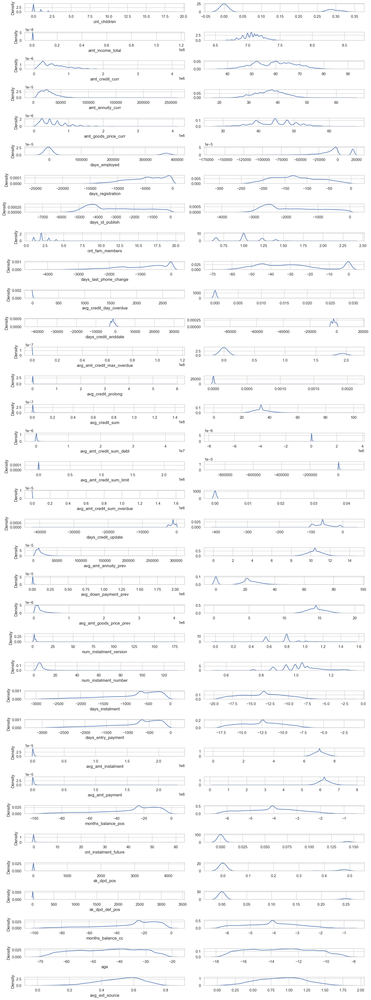

In [35]:
# Feature scaling for training dataset

fig, ax = plt.subplots(len(scaling_columns), 2, figsize=(15, 40))
for i in range(0, len(scaling_columns)):
    data, fitted_lambda = yeojohnson(df_train[scaling_columns[i]], lmbda=None)
    kde1 = sns.kdeplot(df_train[scaling_columns[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
plt.tight_layout()

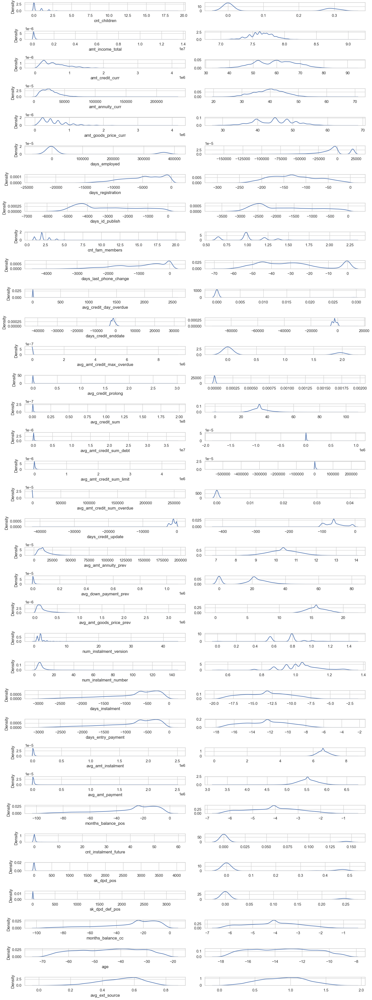

In [36]:
# Feature scaling for validating dataset

fig, ax = plt.subplots(len(scaling_columns), 2, figsize=(15, 40))
for i in range(0, len(scaling_columns)):
    data, fitted_lambda = yeojohnson(df_val[scaling_columns[i]], lmbda=None)
    kde1 = sns.kdeplot(df_val[scaling_columns[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
plt.tight_layout()

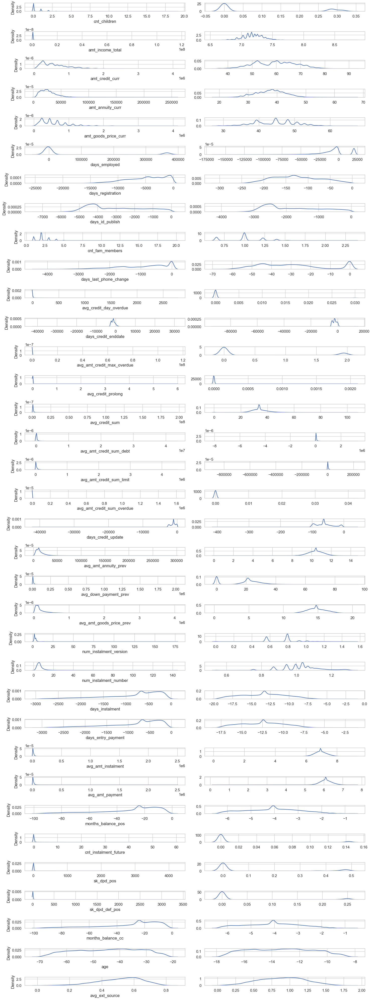

In [37]:
# Feature scaling for full dataset

fig, ax = plt.subplots(len(scaling_columns), 2, figsize=(15, 40))
for i in range(0, len(scaling_columns)):
    data, fitted_lambda = yeojohnson(full_df[scaling_columns[i]], lmbda=None)
    kde1 = sns.kdeplot(full_df[scaling_columns[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
plt.tight_layout()

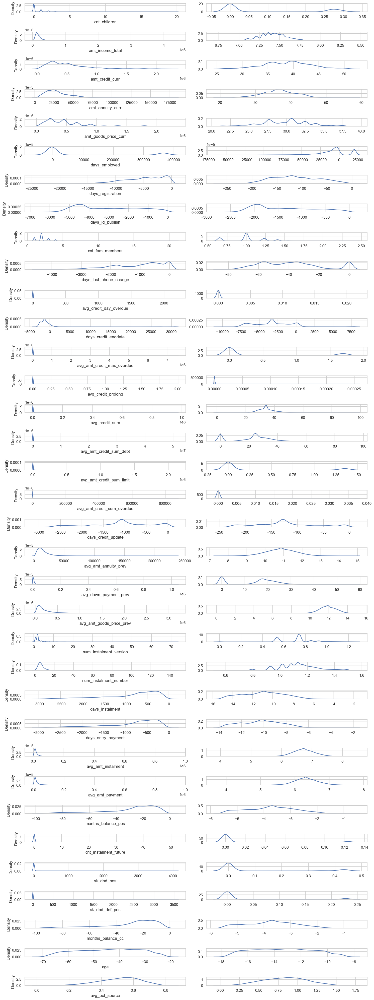

In [38]:
# Feature scaling for testing dataset

fig, ax = plt.subplots(len(scaling_columns), 2, figsize=(15, 40))
for i in range(0, len(scaling_columns)):
    data, fitted_lambda = yeojohnson(df_test[scaling_columns[i]], lmbda=None)
    kde1 = sns.kdeplot(df_test[scaling_columns[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(data, ax=ax[i][1])
    kde2.set_ylabel(None)
plt.tight_layout()

### Feature Encoding

Feature encoding will be performed using label encoding and one-hot encoding with get_dummies. Label encoding will be applied to columns with binary values or categorical values that have ordinal levels, such as `flag_own_car`, `flag_own_realty`, and `name_education_type`. Meanwhile, one-hot encoding will be applied to other categorical columns that do not have ordinal levels.

#### Label Encoding

In [39]:
# Label encoding for flag_own_car column
map_car = {
    'N': 0, 
    'Y': 1
}
df_train['flag_own_car'] = df_train['flag_own_car'].map(map_car)
df_val['flag_own_car'] = df_val['flag_own_car'].map(map_car)
full_df['flag_own_car'] = full_df['flag_own_car'].map(map_car)
df_test['flag_own_car'] = df_test['flag_own_car'].map(map_car)


# Label encoding for flag_own_realty column
map_realty = {
    'N': 0, 
    'Y': 1
}
df_train['flag_own_realty'] = df_train['flag_own_realty'].map(map_realty)
df_val['flag_own_realty'] = df_val['flag_own_realty'].map(map_realty)
full_df['flag_own_realty'] = full_df['flag_own_realty'].map(map_realty)
df_test['flag_own_realty'] = df_test['flag_own_realty'].map(map_realty)


# Label encoding for name_education_type column
map_education = {
    'Lower secondary': 0,
    'Secondary': 1,
    'Above secondary': 2
}
df_train['name_education_type'] = df_train['name_education_type'].map(map_education)
df_val['name_education_type'] = df_val['name_education_type'].map(map_education)
full_df['name_education_type'] = full_df['name_education_type'].map(map_education)
df_test['name_education_type'] = df_test['name_education_type'].map(map_education)

#### One Hot Encoding

In [40]:
df_train = pd.get_dummies(df_train, columns=['name_contract_type_curr', 'code_gender', 'name_income_type', 'name_family_status', 'name_housing_type', 'occupation_type', 'organization_type', 'credit_bureau_active', 'credit_type', 'name_contract_type_prev', 'name_contract_status_prev', 'name_portfolio_prev', 'name_contract_status_pos'])
df_val = pd.get_dummies(df_val, columns=['name_contract_type_curr', 'code_gender', 'name_income_type', 'name_family_status', 'name_housing_type', 'occupation_type', 'organization_type', 'credit_bureau_active', 'credit_type', 'name_contract_type_prev', 'name_contract_status_prev', 'name_portfolio_prev', 'name_contract_status_pos'])
full_df = pd.get_dummies(full_df, columns=['name_contract_type_curr', 'code_gender', 'name_income_type', 'name_family_status', 'name_housing_type', 'occupation_type', 'organization_type', 'credit_bureau_active', 'credit_type', 'name_contract_type_prev', 'name_contract_status_prev', 'name_portfolio_prev', 'name_contract_status_pos'])
df_test = pd.get_dummies(df_test, columns=['name_contract_type_curr', 'code_gender', 'name_income_type', 'name_family_status', 'name_housing_type', 'occupation_type', 'organization_type', 'credit_bureau_active', 'credit_type', 'name_contract_type_prev', 'name_contract_status_prev', 'name_portfolio_prev', 'name_contract_status_pos'])

#### Align Training and Validatig Data Columns

In [41]:
'''
Check for missing columns in the training data compared to the validating data. 
If there are any missing columns, add them with a default value of 0.
'''

# Training dataset
missing_columns_train = set(df_val.columns) - set(df_train.columns)
for col in missing_columns_train:
    df_train[col] = 0
print(f'Shape of training data: {df_train.shape}')

# Validating dataset 
missing_columns_val = set(df_train.columns) - set(df_val.columns)
for col in missing_columns_val:
    df_val[col] = 0
print(f'Shape of validating data: {df_val.shape}')

Shape of training data: (246008, 147)
Shape of validating data: (61503, 147)


#### Dropped Column
The `sk_id_curr` column is dropped as it serves solely as a unique identifier for each client. Hence, this information is unlikely to provide meaningful contributions to the model learning process.

In [42]:
df_train.drop(['sk_id_curr'], axis=1, inplace=True)

### Handle Imbalance

#### Resampling: Upsampling

In [86]:
# Check the distribution of the target column
df_train['target'].value_counts()

0    226148
1     19860
Name: target, dtype: int64

In [33]:
# create two different dataframe of majority and minority class 
majority_class = df_train[(df_train['target'] == 0)] 
minority_class = df_train[(df_train['target'] == 1)] 

# upsample minority class
minority_class_upsampled = resample(minority_class, 
                                    replace=True, # sample with replacement
                                    n_samples=226148, # to match majority class
                                    random_state=42) # reproducible results

# combine majority class with upsampled minority class
df_upsampled = pd.concat([minority_class_upsampled, majority_class])

#### Oversampling using SMOTE

In [105]:
# X_train = df_train.drop('target', axis=1) 
# y_train = df_train['target']

In [44]:
# from imblearn import over_sampling
# from imblearn.over_sampling import SMOTE
#
# print(f'Target in Original Data:')
# print(pd.Series(y_train).value_counts(), end='\n\n')
# X_SMOTE, y_SMOTE = over_sampling.SMOTE(sampling_strategy="auto").fit_resample(X_train, y_train)
# print('Target After Oversampling Using SMOTE:')
# print(pd.Series(y_SMOTE).value_counts())

Target in Original Data:
0    226148
1     19860
Name: target, dtype: int64

Target After Oversampling Using SMOTE:
0    226148
1    226148
Name: target, dtype: int64


#### Oversampling using RandomOverSampler

In [70]:
# from imblearn.over_sampling import RandomOverSampler
# 
# print('Target in Original Data:')
# print(pd.Series(y_train).value_counts(), end='\n\n')
# X_over, y_over = RandomOverSampler(sampling_strategy="auto").fit_resample(X_train, y_train)
# print('Target After Oversampling:')
# print(pd.Series(y_over).value_counts())

Target in Original Data:
0    226148
1     19860
Name: target, dtype: int64

Target After Oversampling:
0    226148
1    226148
Name: target, dtype: int64


#### Undersampling using RandomUnderSampler

In [110]:
# from imblearn.under_sampling import RandomUnderSampler
#
# print('Target in Original Data:')
# print(pd.Series(y_train).value_counts(), end='\n\n')
# X_under, y_under = RandomUnderSampler(sampling_strategy="auto").fit_resample(X_train, y_train)
# print('Target After Oversampling:')
# print(pd.Series(y_train_under).value_counts())

Target in Original Data:
0    226148
1     19860
Name: target, dtype: int64

Target After Oversampling:
0    19860
1    19860
Name: target, dtype: int64


**Summary:**  
Handling imbalanced classes is addressed through resampling, specifically upsampling. This choice is motivated by several factors:
1. Oversampling using SMOTE may not yield accurate predictions, even when applied to imbalanced class training data.
2. While oversampling using RandomOverSampler shows improved performance compared to SMOTE, its effectiveness still falls short of that achieved through upsampling.
3. Undersampling with RandomUnderSampler demonstrates suboptimal performance, possibly due to the limited size of the training data, which is smaller than the validation data, leading to challenges in predicting the validation set.

### Feature Selection

Several feature selection methods were employed in this analysis, including:
1. ANOVA
2. Variance Threshold
3. Mutual Information
4. Select K-Best
5. Feature Importance by ExtraTreesClassifier
6. Multicollinearity

These methods were applied to identify the most relevant features, ensuring the inclusion of variables that provide valuable insights into payment difficulties, and facilitating dimensionality reduction when necessary.

In [273]:
# Define X_train and y_train
X_train = df_upsampled.drop(['target'], axis=1) #features
y_train = df_upsampled['target'] #target

#### ANOVA

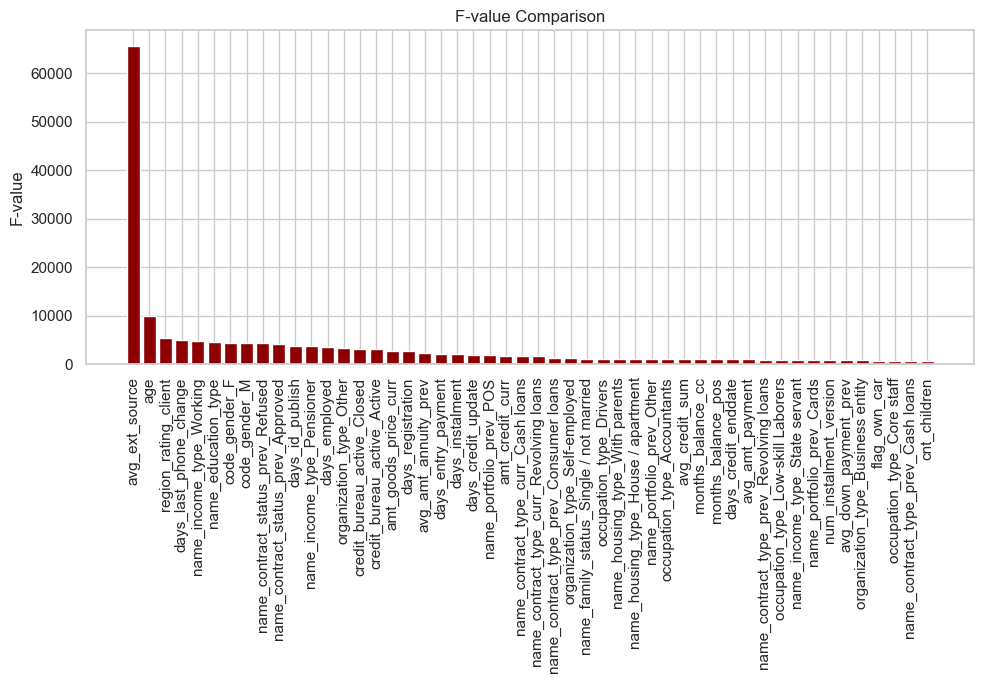

In [274]:
f_value, _ = f_classif(X_train, y_train)

feature_scores = pd.DataFrame({
    "feature_names": X_train.columns,
    "feature_value": f_value
}).sort_values("feature_value", ascending=False)
top_50_features = feature_scores.head(50)

# Create a bar chart
plt.figure(figsize=(10, 7))
plt.bar(data=top_50_features, x="feature_names", height="feature_value", color="darkred")
plt.xticks(rotation="vertical")
plt.ylabel("F-value")
plt.title("F-value Comparison")
plt.tight_layout()
plt.show()

In [276]:
feature_importance = []
for i in feature_scores["feature_names"].values[:10]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['avg_ext_source',
 'age',
 'region_rating_client',
 'days_last_phone_change',
 'name_income_type_Working',
 'name_education_type',
 'code_gender_F',
 'code_gender_M',
 'name_contract_status_prev_Refused',
 'name_contract_status_prev_Approved']

#### Variance Threshold

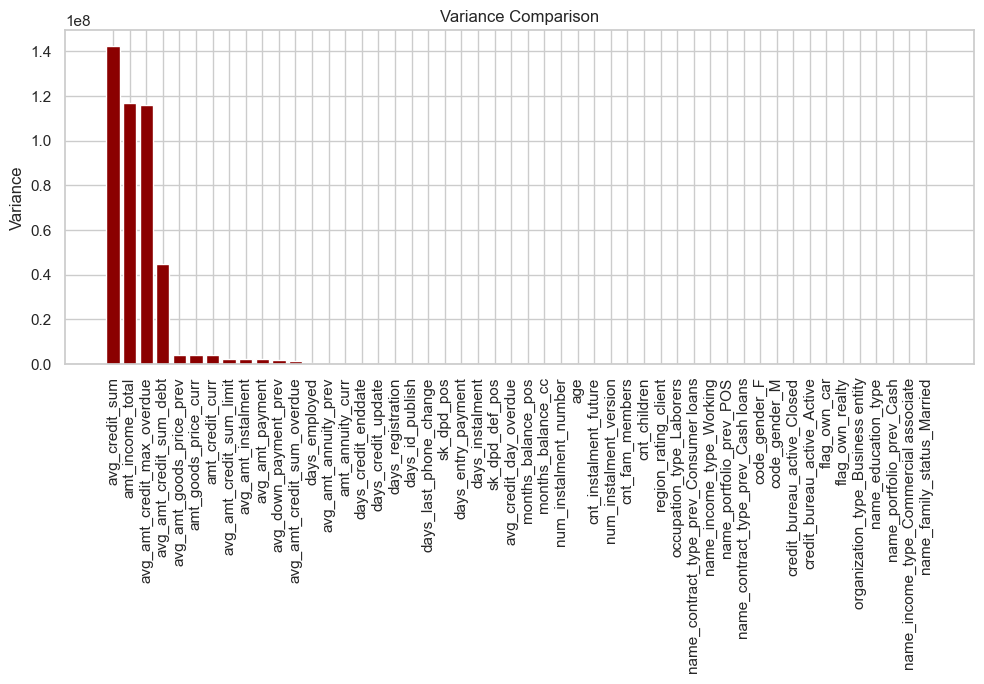

In [277]:
selector = VarianceThreshold(threshold=0.0)
X_train_transformed = selector.fit_transform(X_train)

feature_scores = pd.DataFrame({
    "feature_names": X_train.columns,
    "variances": selector.variances_
}).sort_values("variances", ascending=False)
top_50_features = feature_scores.head(50)

plt.figure(figsize=(10, 7))
plt.bar(data=top_50_features, x="feature_names", height="variances", color="darkred")
plt.xticks(rotation="vertical")
plt.ylabel("Variance")
plt.title("Variance Comparison")
plt.tight_layout()
plt.show()

In [94]:
for i in feature_scores["feature_names"].values[:10]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['avg_ext_source',
 'age',
 'region_rating_client',
 'days_last_phone_change',
 'name_income_type_Working',
 'name_education_type',
 'code_gender_F',
 'code_gender_M',
 'name_contract_status_prev_Refused',
 'name_contract_status_prev_Approved',
 'avg_credit_sum',
 'amt_income_total',
 'avg_amt_credit_max_overdue',
 'avg_amt_credit_sum_debt',
 'avg_amt_goods_price_prev',
 'amt_goods_price_curr',
 'amt_credit_curr',
 'avg_amt_credit_sum_limit',
 'avg_amt_instalment',
 'avg_amt_payment']

#### Mutual Information

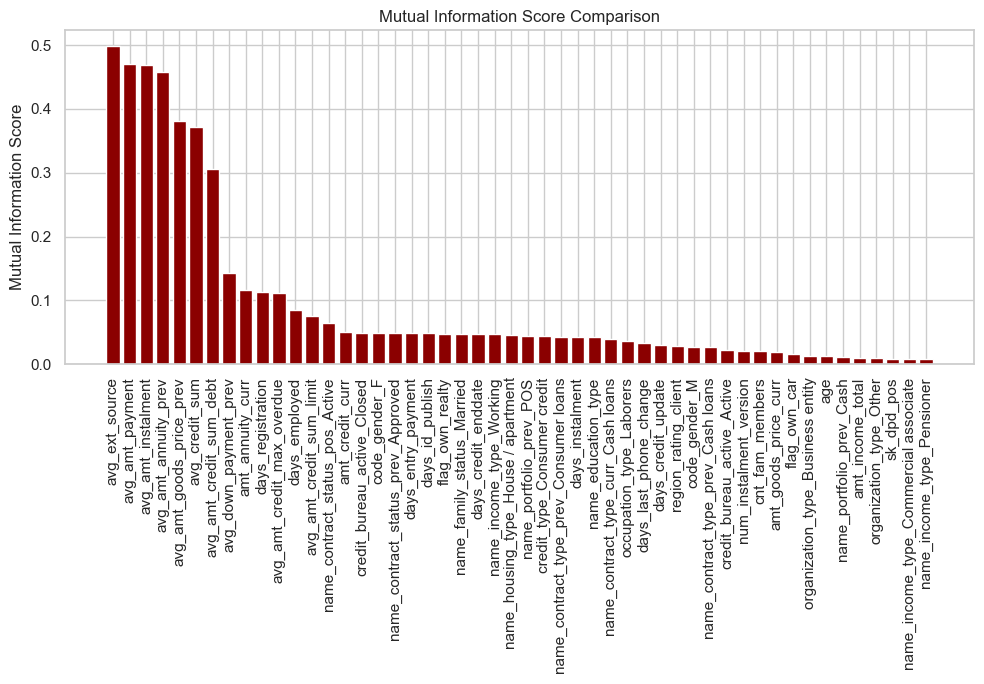

In [279]:
MI_score = mutual_info_classif(X_train, y_train, random_state=0)

feature_scores = pd.DataFrame({
    "feature_names": X_train.columns,
    "MI_score": MI_score
}).sort_values("MI_score", ascending=False)
top_50_features = feature_scores.head(50)

plt.figure(figsize=(10, 7))
plt.bar(data=top_50_features, x="feature_names", height="MI_score", color="darkred")
plt.xticks(rotation="vertical")
plt.ylabel("Mutual Information Score")
plt.title("Mutual Information Score Comparison")
plt.tight_layout()
plt.show()

In [280]:
for i in feature_scores["feature_names"].values[:10]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['avg_ext_source',
 'age',
 'region_rating_client',
 'days_last_phone_change',
 'name_income_type_Working',
 'name_education_type',
 'code_gender_F',
 'code_gender_M',
 'name_contract_status_prev_Refused',
 'name_contract_status_prev_Approved',
 'avg_credit_sum',
 'amt_income_total',
 'avg_amt_credit_max_overdue',
 'avg_amt_credit_sum_debt',
 'avg_amt_goods_price_prev',
 'amt_goods_price_curr',
 'amt_credit_curr',
 'avg_amt_credit_sum_limit',
 'avg_amt_instalment',
 'avg_amt_payment',
 'avg_amt_annuity_prev',
 'avg_down_payment_prev',
 'amt_annuity_curr',
 'days_registration']

#### Select K-Best

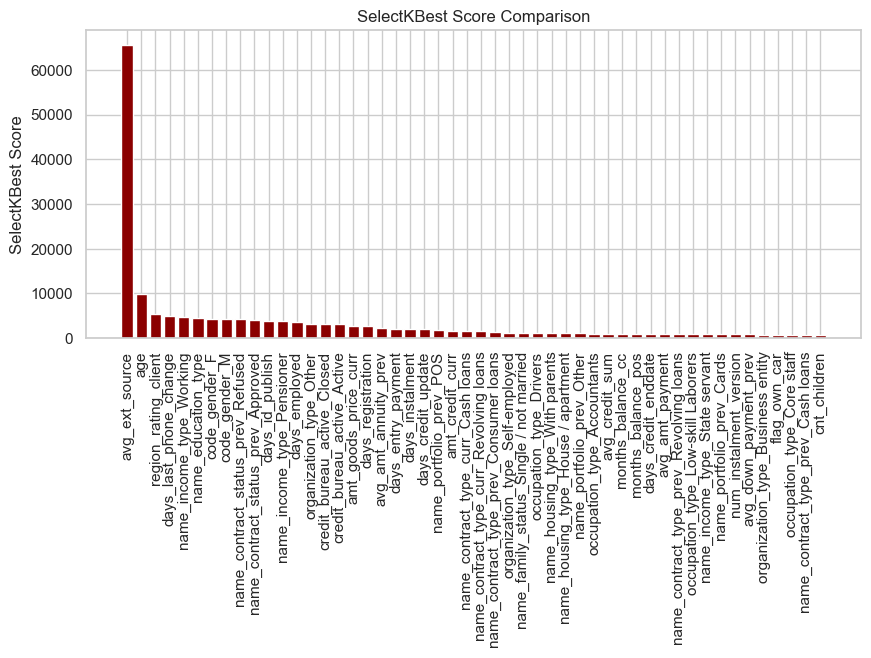

In [281]:
bestfeatures = SelectKBest(score_func=f_classif, k=10)
fit = bestfeatures.fit(X_train, y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_train.columns)

feature_scores = pd.concat([dfcolumns, dfscores], axis=1)
feature_scores.columns = ['Specs', 'Score']  
feature_scores.sort_values('Score', ascending=False, inplace=True)
top_50_features = feature_scores.head(50)

plt.figure(figsize=(10, 4))
plt.bar(data=top_50_features, x="Specs", height="Score", color="darkred")
plt.xticks(rotation="vertical")
plt.ylabel("SelectKBest Score")
plt.title("SelectKBest Score Comparison")
plt.show()

In [98]:
for i in feature_scores["Specs"].values[:10]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['avg_ext_source',
 'age',
 'region_rating_client',
 'days_last_phone_change',
 'name_income_type_Working',
 'name_education_type',
 'code_gender_F',
 'code_gender_M',
 'name_contract_status_prev_Refused',
 'name_contract_status_prev_Approved',
 'avg_credit_sum',
 'amt_income_total',
 'avg_amt_credit_max_overdue',
 'avg_amt_credit_sum_debt',
 'avg_amt_goods_price_prev',
 'amt_goods_price_curr',
 'amt_credit_curr',
 'avg_amt_credit_sum_limit',
 'avg_amt_instalment',
 'avg_amt_payment',
 'avg_amt_annuity_prev',
 'avg_down_payment_prev',
 'amt_annuity_curr',
 'days_registration']

#### Feature Importance by ExtraTreesClassifier

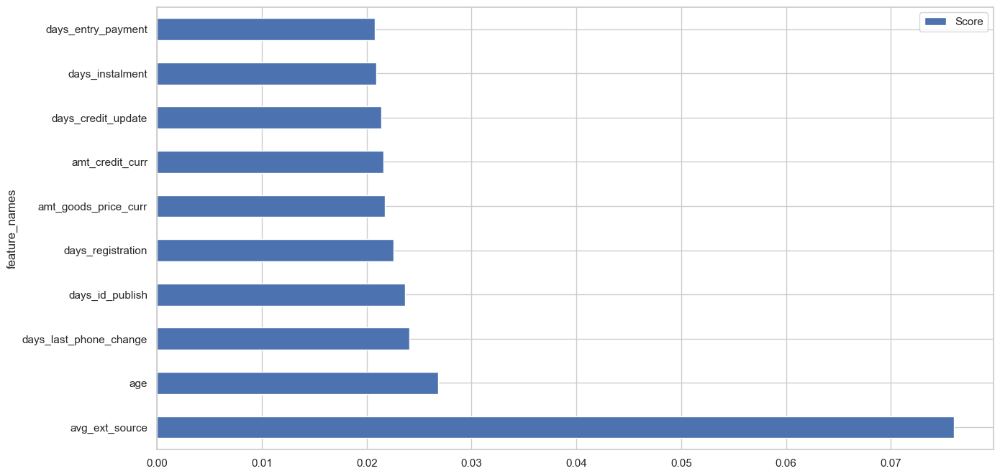

In [99]:
model = ExtraTreesClassifier()
model.fit(X_train, y_train)

feat_importances = pd.Series(model.feature_importances_, index=X_train.columns)
feat_importances = pd.DataFrame(feat_importances).reset_index(names="feature_names") \
    .rename(columns={0:"Score"}) \
    .sort_values("Score", ascending=False).reset_index(drop=True)
feat_importances.nlargest(10, "Score").plot(x="feature_names", y="Score", kind='barh')
plt.show()

In [100]:
for i in feat_importances["feature_names"].values[:10]:
    if i not in feature_importance:
        feature_importance.append(i)
feature_importance

['avg_ext_source',
 'age',
 'region_rating_client',
 'days_last_phone_change',
 'name_income_type_Working',
 'name_education_type',
 'code_gender_F',
 'code_gender_M',
 'name_contract_status_prev_Refused',
 'name_contract_status_prev_Approved',
 'avg_credit_sum',
 'amt_income_total',
 'avg_amt_credit_max_overdue',
 'avg_amt_credit_sum_debt',
 'avg_amt_goods_price_prev',
 'amt_goods_price_curr',
 'amt_credit_curr',
 'avg_amt_credit_sum_limit',
 'avg_amt_instalment',
 'avg_amt_payment',
 'avg_amt_annuity_prev',
 'avg_down_payment_prev',
 'amt_annuity_curr',
 'days_registration',
 'days_id_publish',
 'days_credit_update',
 'days_instalment',
 'days_entry_payment']

#### Multicollinearity

In [101]:
corr = df_train.corrwith(df_train["target"], numeric_only=True)
corr = corr.reset_index(name='corr value')
corr["Corr Type"] = corr["corr value"].apply(lambda x : "Positif" if x >= 0 else "Negatif")
corr["corr value"] = corr["corr value"].apply(lambda x : abs(x))
corr = corr.sort_values('corr value', ascending=False, ignore_index=True)
corr.head(10)

,index,corr value,Corr Type
0,target,1.00,Positif
1,avg_ext_source,0.21,Negatif
2,age,0.08,Positif
3,name_contract_status_prev_Refused,0.06,Positif
4,region_rating_client,0.06,Positif
5,name_contract_status_prev_Approved,0.06,Negatif
6,name_income_type_Working,0.06,Positif
7,code_gender_M,0.05,Positif
8,code_gender_F,0.05,Negatif
9,days_last_phone_change,0.05,Positif


In [102]:
corr = df_train.corrwith(df_train["target"], numeric_only=True)
corr = corr.reset_index(name='corr value')
corr = corr.sort_values('corr value', ascending=False)[1:]

target = "target"
high_corr_cols = [i for i in list(corr[corr["corr value"] > -1]["index"].values) if i != target]

In [103]:
for i in corr["index"].values[:10]:
    if i not in feature_importance and not target:
        feature_importance.append(i)
feature_importance

['avg_ext_source',
 'age',
 'region_rating_client',
 'days_last_phone_change',
 'name_income_type_Working',
 'name_education_type',
 'code_gender_F',
 'code_gender_M',
 'name_contract_status_prev_Refused',
 'name_contract_status_prev_Approved',
 'avg_credit_sum',
 'amt_income_total',
 'avg_amt_credit_max_overdue',
 'avg_amt_credit_sum_debt',
 'avg_amt_goods_price_prev',
 'amt_goods_price_curr',
 'amt_credit_curr',
 'avg_amt_credit_sum_limit',
 'avg_amt_instalment',
 'avg_amt_payment',
 'avg_amt_annuity_prev',
 'avg_down_payment_prev',
 'amt_annuity_curr',
 'days_registration',
 'days_id_publish',
 'days_credit_update',
 'days_instalment',
 'days_entry_payment']

<Axes: >

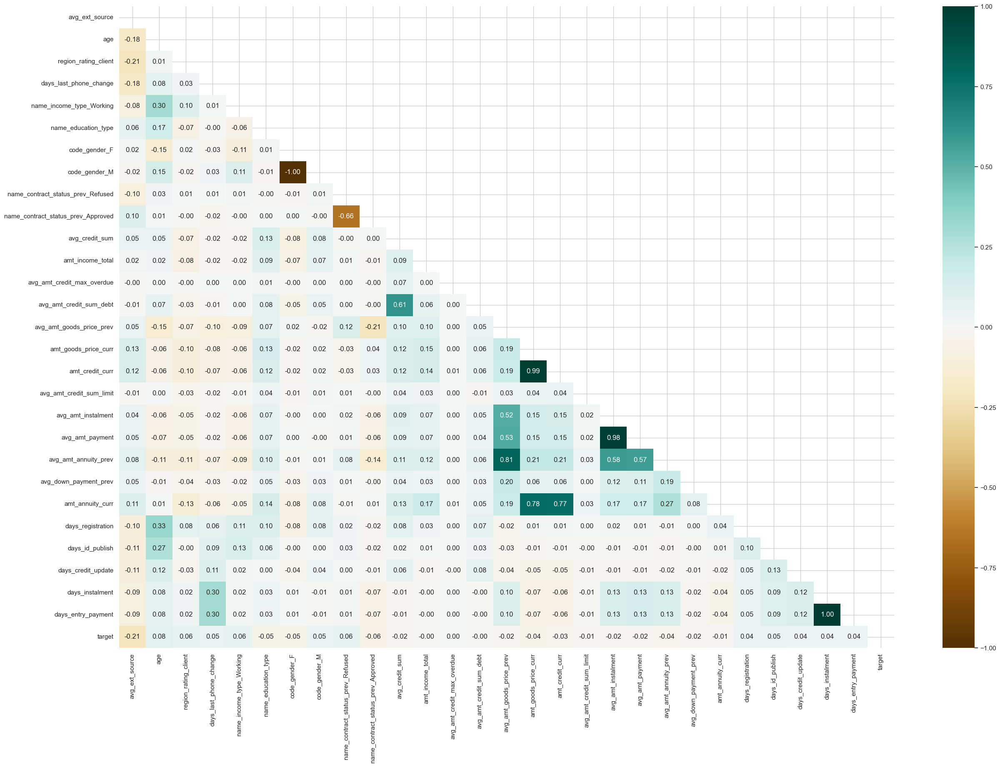

In [104]:
plt.figure(figsize=(30, 20))
corr = df_train[feature_importance+["target"]].corr(numeric_only=True)
mask = np.triu(np.ones_like(corr, dtype=np.bool_))
sns.heatmap(corr, vmin=-1, vmax=1, cmap='BrBG', annot=True, fmt='.2f', mask=mask)

In [283]:
final_feature = ['avg_ext_source', 'age', 'region_rating_client', 'days_last_phone_change', 
                 'name_income_type_Working', 'name_education_type', 'code_gender_M', 
                 'name_contract_status_prev_Refused', 'name_contract_status_prev_Approved', 
                 'avg_credit_sum', 'amt_income_total', 'avg_amt_credit_max_overdue', 
                 'avg_amt_credit_sum_debt', 'avg_amt_goods_price_prev', 'amt_goods_price_curr', 
                 'avg_amt_credit_sum_limit', 'avg_amt_instalment', 'avg_amt_payment', 
                 'avg_amt_annuity_prev', 'avg_down_payment_prev', 'amt_annuity_curr', 
                 'days_registration', 'days_id_publish', 'days_credit_update', 'days_entry_payment']

### Define X (Features) and y (Target) for Modeling

In [35]:
# Features and target for training model
X_train = df_upsampled.drop(['target'], axis=1)[final_feature].reset_index(drop=True) 
y_train = df_upsampled['target'].reset_index(drop=True) 
print(f'Shape of X_train and y_train: {X_train.shape, y_train.shape}')

# Features and target for validating model
X_val = df_val.drop(['target'], axis=1)[final_feature].reset_index(drop=True) 
y_val = df_val['target'].reset_index(drop=True) 
print(f'Shape of X_val and y_val: {X_val.shape, y_val.shape}')

Shape of X_train and y_train: ((452296, 25), (452296,))
Shape of X_val and y_val: ((61503, 25), (61503,))


In [285]:
# Features and target for testing model
X_tot = test_df.drop(['target'], axis=1)[final_feature].reset_index(drop=True) 
y_tot = test_df['target'].reset_index(drop=True) 
print(f'Shape of X_tot and y_tot: {X_tot.shape, y_tot.shape}')

Shape of X_tot and y_tot: ((307511, 25), (307511,))


## Modeling
Due to the absence of outlier handling, machine learning model development is exclusively carried out for algorithms that are more tolerant or robust to outlier data, such as:
1. Decision Tree
2. Random Forest
3. Adaptive Boosting Classifier
4. eXtreme Gradient Boosting Classifier
5. Gradient Boosting Classifier

Meanwhile, the use of `Logistic Regression` is a <b>special case</b> as it is a model specifically requested by stakeholders.

### Logistic Regression

In [271]:
lr_model = LogisticRegression().fit(X_train, y_train)
print(lr_model)

LogisticRegression()


#### Predict Data Train

In [122]:
y_train_pred_lr = lr_model.predict(X_train)
print('Classification Report Training Model (Logistic Regression):')
print(classification_report(y_train, y_train_pred_lr))

Classification Report Training Model (Logistic Regression):
              precision    recall  f1-score   support

           0       0.56      0.67      0.61    226148
           1       0.59      0.48      0.53    226148

    accuracy                           0.58    452296
   macro avg       0.58      0.58      0.57    452296
weighted avg       0.58      0.58      0.57    452296



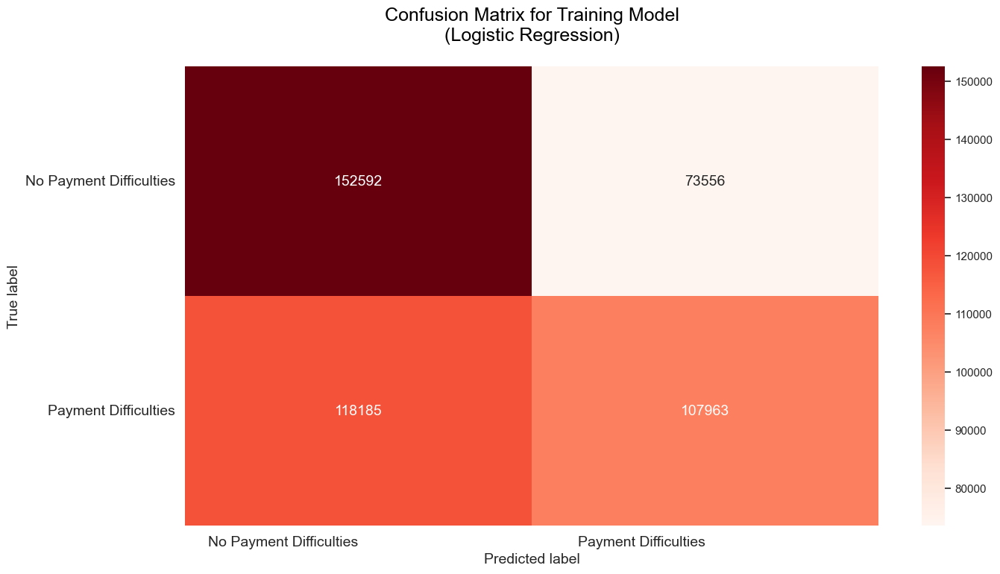

In [123]:
# Form confusion matrix as a dataFrame
confusion_matrix_lr = pd.DataFrame((confusion_matrix(y_train, y_train_pred_lr)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_lr, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Training Model\n(Logistic Regression)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Predict Data Validation

In [124]:
y_val_pred_lr = lr_model.predict(X_val)

print('Classification Report Validating Model (Logistic Regression):')
print(classification_report(y_val, y_val_pred_lr))

Classification Report Validating Model (Logistic Regression):
              precision    recall  f1-score   support

           0       0.94      0.67      0.78     56538
           1       0.11      0.48      0.18      4965

    accuracy                           0.66     61503
   macro avg       0.52      0.57      0.48     61503
weighted avg       0.87      0.66      0.73     61503



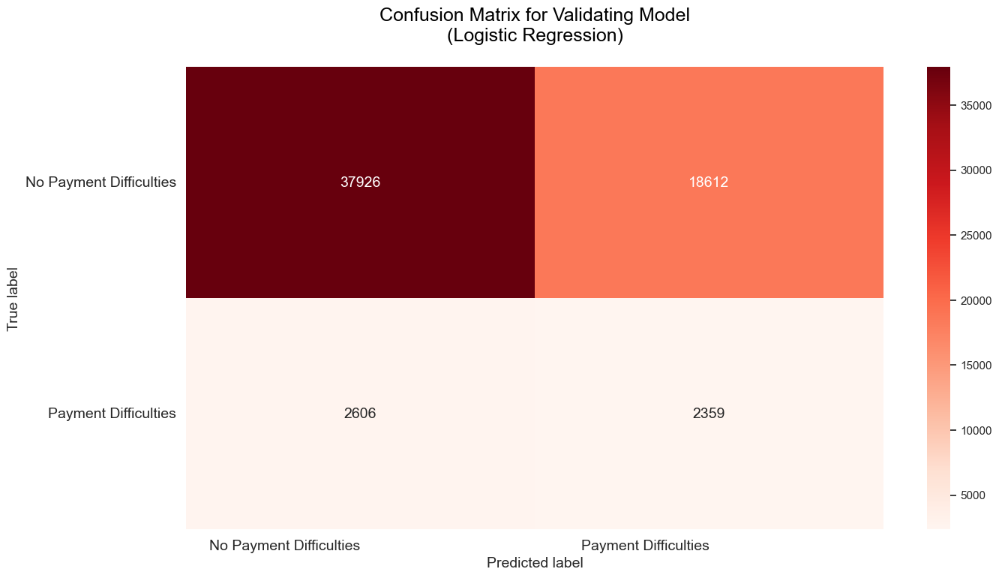

In [125]:
# Form confusion matrix as a dataFrame
confusion_matrix_lr = pd.DataFrame((confusion_matrix(y_val, y_val_pred_lr)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_lr, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Validating Model\n(Logistic Regression)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Model Performance

In [126]:
# Recall
recall_train = recall_score(y_train, y_train_pred_lr)
print(f'Recall Train: {round(recall_train, 2)}')
recall_val = recall_score(y_val, y_val_pred_lr, average='weighted')
print(f'Recall Validation: {round(recall_val, 2)}', end='\n\n')

# Precision
precision_train = precision_score(y_train, y_train_pred_lr)
print(f'Precision Train: {round(precision_train, 2)}')
precision_val = precision_score(y_val, y_val_pred_lr, average='weighted')
print(f'Precision Validation: {round(precision_val, 2)}', end='\n\n')

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred_lr)
print(f'Accuracy Train: {round(accuracy_train, 2)}')
accuracy_val = accuracy_score(y_val, y_val_pred_lr)
print(f'Accuracy Validation: {round(accuracy_val, 2)}')

Recall Train: 0.48
Recall Validation: 0.66

Precision Train: 0.59
Precision Validation: 0.87

Accuracy Train: 0.58
Accuracy Validation: 0.66


**Summary:**
Using the `average='weighted'` parameter on validation data due to its imbalanced target, provides a more accurate depiction of the model's performance in handling the uneven distribution of target classes. 

In [82]:
# Function to plot ROC curve
def plot_roc_curve(fpr, tpr, auc, title):
    plt.plot(fpr, tpr, label=f'ROC Curve, AUC = {auc}')
    plt.plot([0, 1], [0, 1], 'k--', label='Random')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc='lower right')

ROC AUC (Train): 0.58
ROC AUC (Validation): 0.57


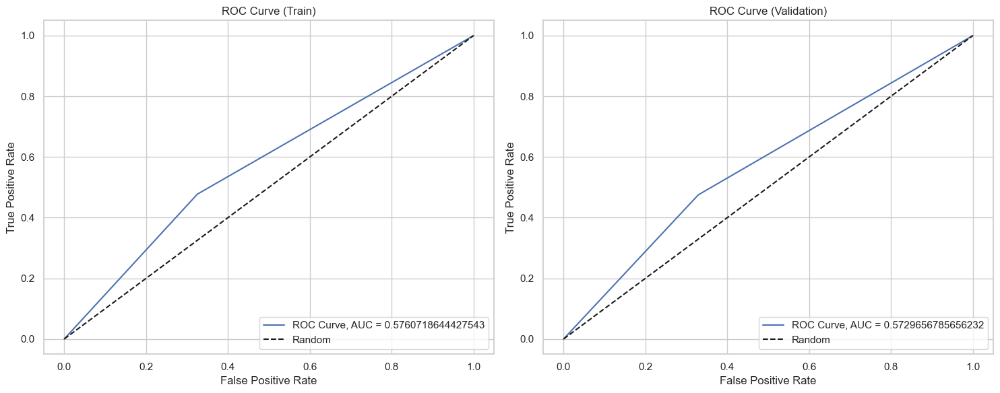

In [127]:
# ROC AUC (Train)
roc_auc_train = roc_auc_score(y_train, y_train_pred_lr)
print(f'ROC AUC (Train): {round(roc_auc_train, 2)}')
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_lr) # ROC Curve (Train)

# ROC AUC (Validation)
roc_auc_val = roc_auc_score(y_val, y_val_pred_lr)
print(f'ROC AUC (Validation): {round(roc_auc_val, 2)}')
fpr_val, tpr_val, thresholds_val = roc_curve(y_val, y_val_pred_lr) # ROC Curve (Validation)

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plot_roc_curve(fpr_train, tpr_train, roc_auc_train, 'ROC Curve (Train)')
plt.subplot(1, 2, 2)
plot_roc_curve(fpr_val, tpr_val, roc_auc_val, 'ROC Curve (Validation)')
plt.tight_layout()
plt.show()

### Decision Tree

In [187]:
dt_model = DecisionTreeClassifier().fit(X_train, y_train)
print(dt_model)

DecisionTreeClassifier()


#### Predict Data Train

In [129]:
y_train_pred_dt = dt_model.predict(X_train)
print('Classification Report Training Model (Decision Tree):')
print(classification_report(y_train, y_train_pred_dt))

Classification Report Training Model (Decision Tree):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226148
           1       1.00      1.00      1.00    226148

    accuracy                           1.00    452296
   macro avg       1.00      1.00      1.00    452296
weighted avg       1.00      1.00      1.00    452296



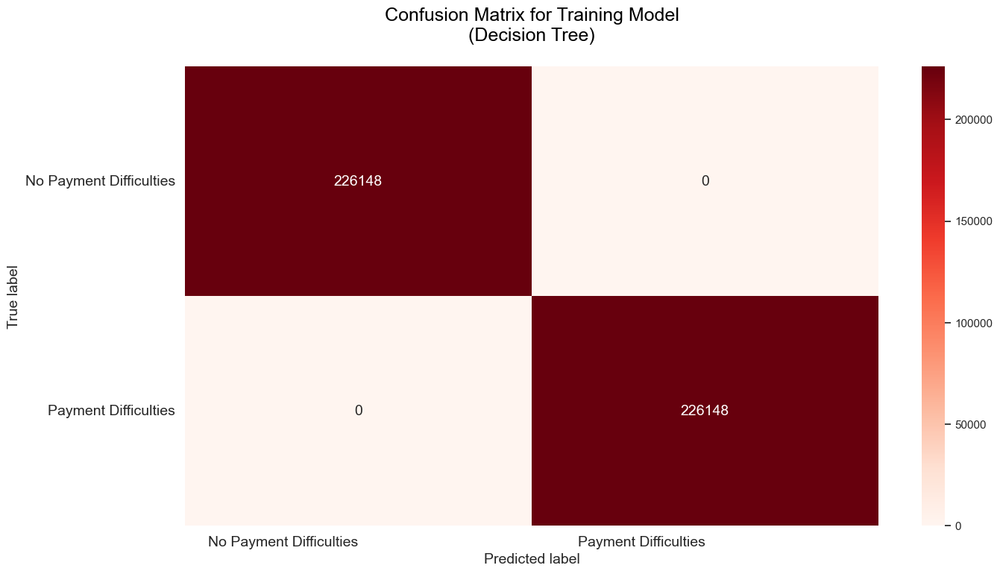

In [130]:
# Form confusion matrix as a dataFrame
confusion_matrix_dt = pd.DataFrame((confusion_matrix(y_train, y_train_pred_dt)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_dt, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Training Model\n(Decision Tree)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Predict Data Validation

In [131]:
y_val_pred_dt = dt_model.predict(X_val)
print('Classification Report Validating Model (Decision Tree):')
print(classification_report(y_val, y_val_pred_dt))

Classification Report Validating Model (Decision Tree):
              precision    recall  f1-score   support

           0       0.93      0.92      0.92     56538
           1       0.15      0.16      0.16      4965

    accuracy                           0.86     61503
   macro avg       0.54      0.54      0.54     61503
weighted avg       0.86      0.86      0.86     61503



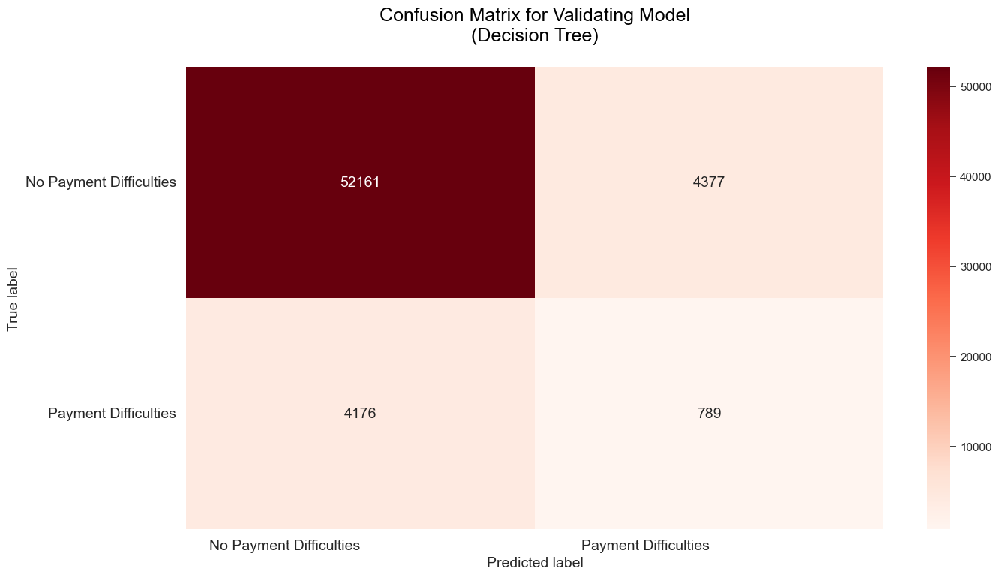

In [132]:
# Form confusion matrix as a dataFrame
confusion_matrix_dt = pd.DataFrame((confusion_matrix(y_val, y_val_pred_dt)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_dt, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Validating Model\n(Decision Tree)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Model Performance

In [133]:
# Recall
recall_train = recall_score(y_train, y_train_pred_dt)
print(f'Recall Train: {round(recall_train, 2)}')
recall_val = recall_score(y_val, y_val_pred_dt, average='weighted')
print(f'Recall Validation: {round(recall_val, 2)}', end='\n\n')

# Precision
precision_train = precision_score(y_train, y_train_pred_dt)
print(f'Precision Train: {round(precision_train, 2)}')
precision_val = precision_score(y_val, y_val_pred_dt, average='weighted')
print(f'Precision Validation: {round(precision_val, 2)}', end='\n\n')

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred_dt)
print(f'Accuracy Train: {round(accuracy_train, 2)}')
accuracy_val = accuracy_score(y_val, y_val_pred_lr)
print(f'Accuracy Validation: {round(accuracy_val, 2)}')

Recall Train: 1.0
Recall Validation: 0.86

Precision Train: 1.0
Precision Validation: 0.86

Accuracy Train: 1.0
Accuracy Validation: 0.66


ROC AUC (Train): 1.0
ROC AUC (Validation): 0.54


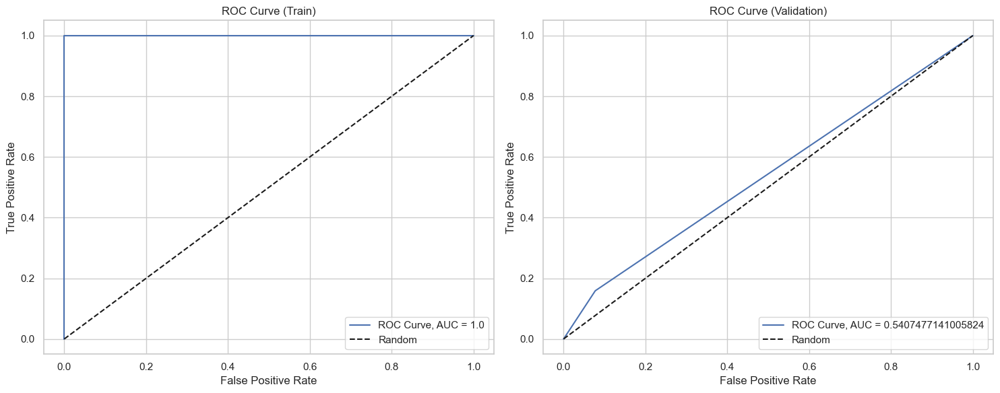

In [134]:
# ROC AUC (Train)
roc_auc_train = roc_auc_score(y_train, y_train_pred_dt)
print(f'ROC AUC (Train): {round(roc_auc_train, 2)}')
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_dt) # ROC Curve (Train)

# ROC AUC (Validation)
roc_auc_val = roc_auc_score(y_val, y_val_pred_dt)
print(f'ROC AUC (Validation): {round(roc_auc_val, 2)}')
fpr_val, tpr_val, thresholds_val = roc_curve(y_val, y_val_pred_dt) # ROC Curve (Validation)

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plot_roc_curve(fpr_train, tpr_train, roc_auc_train, 'ROC Curve (Train)')
plt.subplot(1, 2, 2)
plot_roc_curve(fpr_val, tpr_val, roc_auc_val, 'ROC Curve (Validation)')
plt.tight_layout()
plt.show()

### Random Forest

In [287]:
rf_model = RandomForestClassifier().fit(X_train, y_train)
print(rf_model)

RandomForestClassifier()


#### Predict Data Train

In [37]:
y_train_pred_rf = rf_model.predict(X_train)
print('Classification Report Training Model (Random Forest):')
print(classification_report(y_train, y_train_pred_rf))

Classification Report Training Model (Random Forest):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226148
           1       1.00      1.00      1.00    226148

    accuracy                           1.00    452296
   macro avg       1.00      1.00      1.00    452296
weighted avg       1.00      1.00      1.00    452296



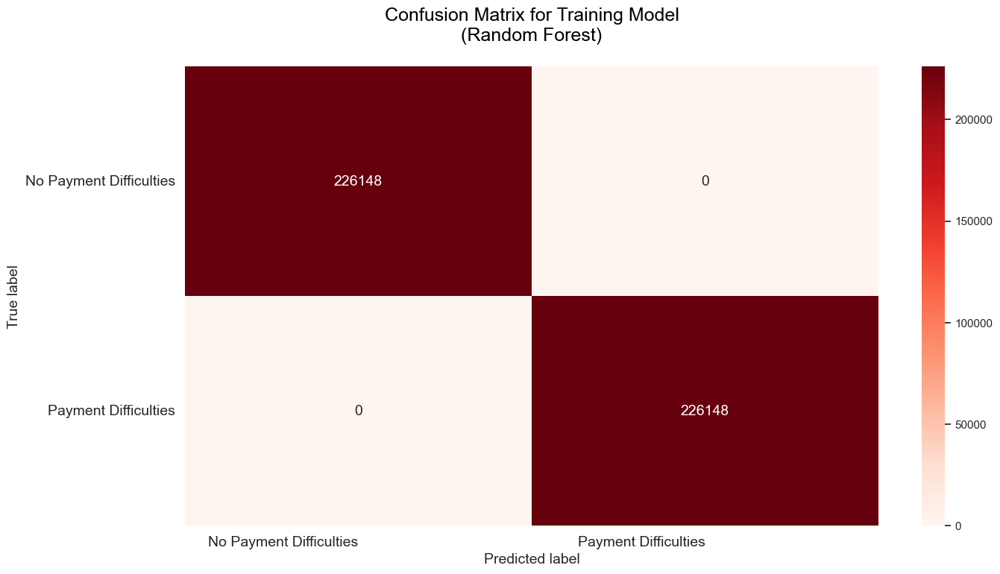

In [38]:
# Form confusion matrix as a dataFrame
confusion_matrix_rf = pd.DataFrame((confusion_matrix(y_train, y_train_pred_rf)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_rf, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Training Model\n(Random Forest)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Predict Data Validation

In [39]:
y_val_pred_rf = rf_model.predict(X_val)
print('Classification Report Validating Model (Random Forest):')
print(classification_report(y_val, y_val_pred_rf))

Classification Report Validating Model (Random Forest):
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56538
           1       0.42      0.02      0.05      4965

    accuracy                           0.92     61503
   macro avg       0.67      0.51      0.50     61503
weighted avg       0.88      0.92      0.88     61503



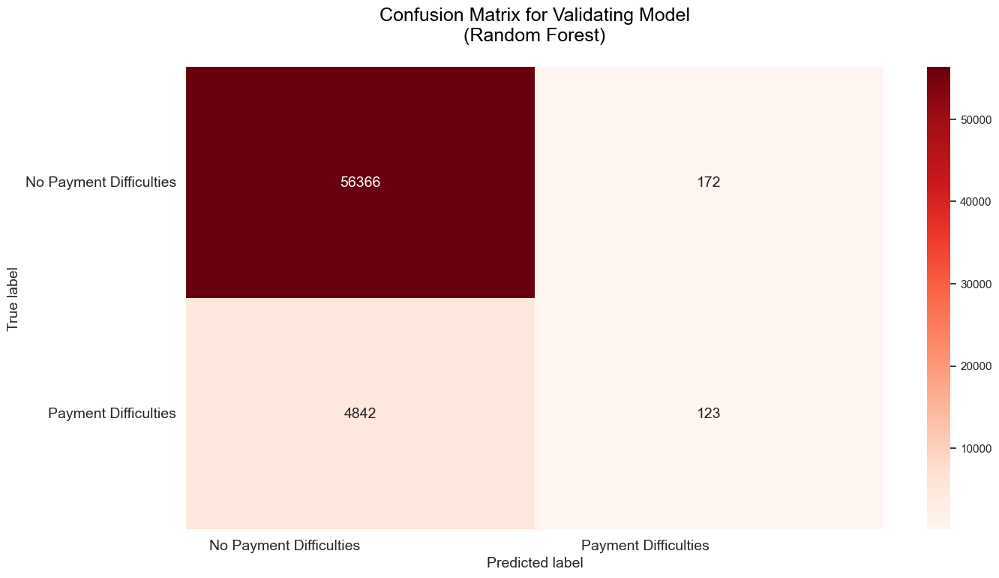

In [40]:
# Form confusion matrix as a dataFrame
confusion_matrix_rf = pd.DataFrame((confusion_matrix(y_val, y_val_pred_rf)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_rf, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Validating Model\n(Random Forest)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Model Performance

In [59]:
# Recall
recall_train = recall_score(y_train, y_train_pred_rf)
print(f'Recall Train: {round(recall_train, 2)}')
recall_val = recall_score(y_val, y_val_pred_rf, average='weighted')
print(f'Recall Validation: {round(recall_val, 2)}', end='\n\n')

# Precision
precision_train = precision_score(y_train, y_train_pred_rf)
print(f'Precision Train: {round(precision_train, 2)}')
precision_val = precision_score(y_val, y_val_pred_rf, average='weighted')
print(f'Precision Validation: {round(precision_val, 2)}', end='\n\n')

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred_rf)
print(f'Accuracy Train: {round(accuracy_train, 2)}')
accuracy_val = accuracy_score(y_val, y_val_pred_rf)
print(f'Accuracy Validation: {round(accuracy_val, 2)}')

Recall Train: 1.0
Recall Validation: 0.92

Precision Train: 1.0
Precision Validation: 0.88

Accuracy Train: 1.0
Accuracy Validation: 0.92


ROC AUC (Train): 1.0
ROC AUC (Validation): 0.51


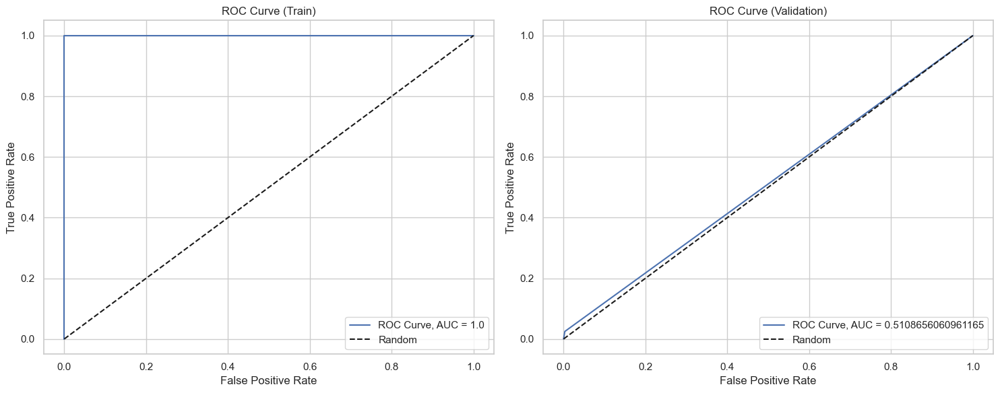

In [80]:
# ROC AUC (Train)
roc_auc_train = roc_auc_score(y_train, y_train_pred_rf)
print(f'ROC AUC (Train): {round(roc_auc_train, 2)}')
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_rf) # ROC Curve (Train)

# ROC AUC (Validation)
roc_auc_val = roc_auc_score(y_val, y_val_pred_rf)
print(f'ROC AUC (Validation): {round(roc_auc_val, 2)}')
fpr_val, tpr_val, thresholds_val = roc_curve(y_val, y_val_pred_rf) # ROC Curve (Validation)

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plot_roc_curve(fpr_train, tpr_train, roc_auc_train, 'ROC Curve (Train)')
plt.subplot(1, 2, 2)
plot_roc_curve(fpr_val, tpr_val, roc_auc_val, 'ROC Curve (Validation)')
plt.tight_layout()
plt.show()

### Adaptive Boosting (Adaboost) Classifier

In [202]:
adaboost_model = AdaBoostClassifier().fit(X_train, y_train)
print(adaboost_model)

AdaBoostClassifier()


#### Predict Data Train

In [136]:
y_train_pred_adaboost = adaboost_model.predict(X_train)
print('Classification Report Training Model (Adaboost Classifier):')
print(classification_report(y_train, y_train_pred_adaboost))

Classification Report Training Model (Adaboost Classifier):
              precision    recall  f1-score   support

           0       0.68      0.68      0.68    226148
           1       0.68      0.68      0.68    226148

    accuracy                           0.68    452296
   macro avg       0.68      0.68      0.68    452296
weighted avg       0.68      0.68      0.68    452296



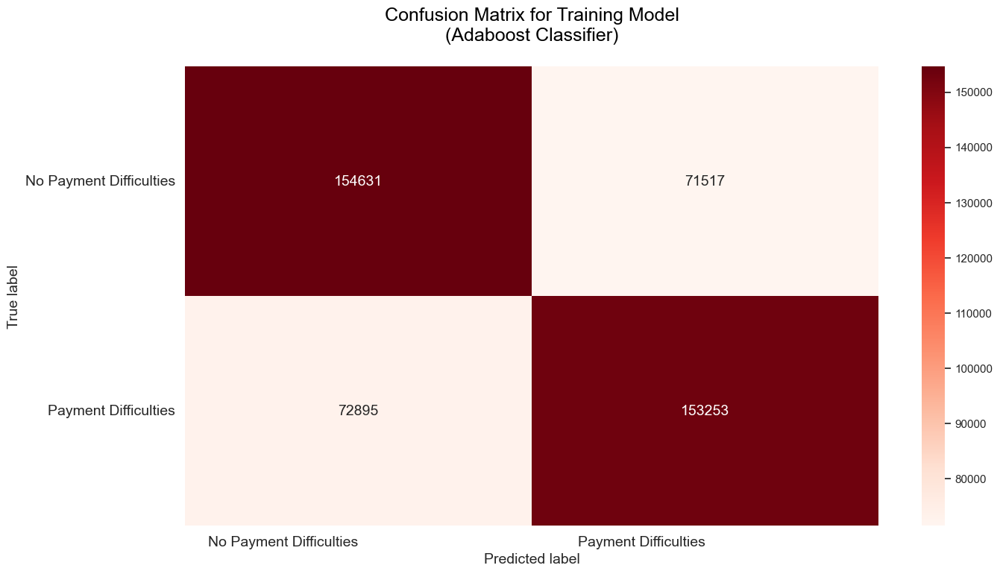

In [137]:
# Form confusion matrix as a dataFrame
confusion_matrix_adaboost = pd.DataFrame((confusion_matrix(y_train, y_train_pred_adaboost)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_adaboost, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Training Model\n(Adaboost Classifier)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Predict Data Validation

In [138]:
y_val_pred_adaboost = adaboost_model.predict(X_val)
print('Classification Report Validating Model (Adaboost Classifier):')
print(classification_report(y_val, y_val_pred_adaboost))

Classification Report Validating Model (Adaboost Classifier):
              precision    recall  f1-score   support

           0       0.96      0.69      0.80     56538
           1       0.16      0.67      0.26      4965

    accuracy                           0.69     61503
   macro avg       0.56      0.68      0.53     61503
weighted avg       0.90      0.69      0.76     61503



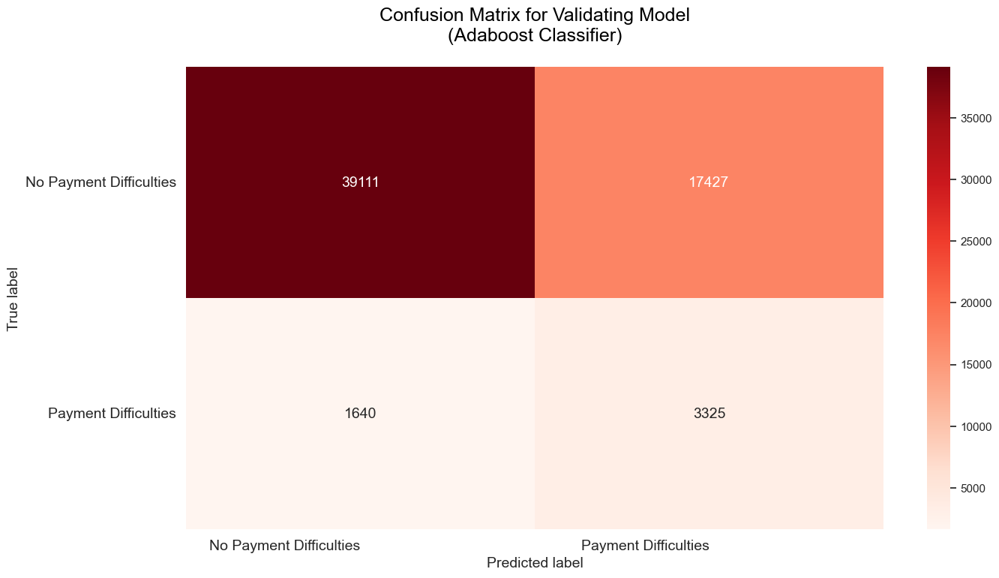

In [139]:
# Form confusion matrix as a dataFrame
confusion_matrix_adaboost = pd.DataFrame((confusion_matrix(y_val, y_val_pred_adaboost)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_adaboost, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Validating Model\n(Adaboost Classifier)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Model Performance

In [140]:
# Recall
recall_train = recall_score(y_train, y_train_pred_adaboost)
print(f'Recall Train: {round(recall_train, 2)}')
recall_val = recall_score(y_val, y_val_pred_adaboost, average='weighted')
print(f'Recall Validation: {round(recall_val, 2)}', end='\n\n')

# Precision
precision_train = precision_score(y_train, y_train_pred_adaboost)
print(f'Precision Train: {round(precision_train, 2)}')
precision_val = precision_score(y_val, y_val_pred_adaboost, average='weighted')
print(f'Precision Validation: {round(precision_val, 2)}', end='\n\n')

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred_adaboost)
print(f'Accuracy Train: {round(accuracy_train, 2)}')
accuracy_val = accuracy_score(y_val, y_val_pred_adaboost)
print(f'Accuracy Validation: {round(accuracy_val, 2)}')

Recall Train: 0.68
Recall Validation: 0.69

Precision Train: 0.68
Precision Validation: 0.9

Accuracy Train: 0.68
Accuracy Validation: 0.69


ROC AUC (Train): 0.68
ROC AUC (Validation): 0.68


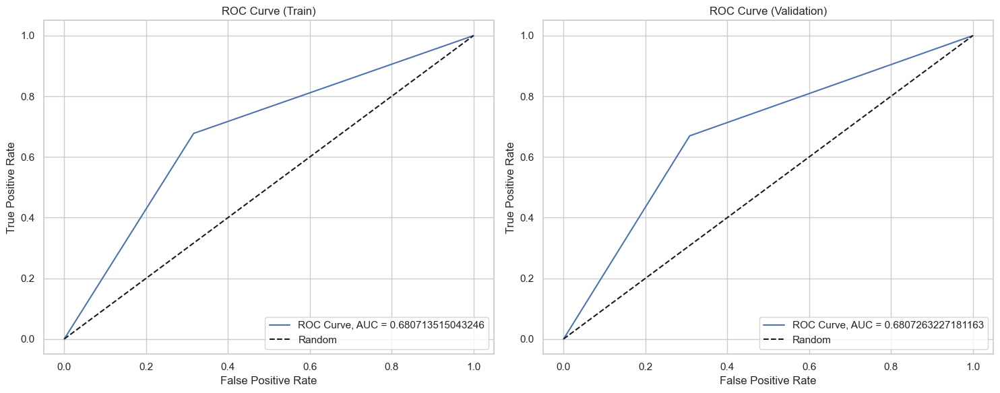

In [141]:
# ROC AUC (Train)
roc_auc_train = roc_auc_score(y_train, y_train_pred_adaboost)
print(f'ROC AUC (Train): {round(roc_auc_train, 2)}')
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_adaboost) # ROC Curve (Train)

# ROC AUC (Validation)
roc_auc_val = roc_auc_score(y_val, y_val_pred_adaboost)
print(f'ROC AUC (Validation): {round(roc_auc_val, 2)}')
fpr_val, tpr_val, thresholds_val = roc_curve(y_val, y_val_pred_adaboost) # ROC Curve (Validation)

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plot_roc_curve(fpr_train, tpr_train, roc_auc_train, 'ROC Curve (Train)')
plt.subplot(1, 2, 2)
plot_roc_curve(fpr_val, tpr_val, roc_auc_val, 'ROC Curve (Validation)')
plt.tight_layout()
plt.show()

### eXtreme Gradient Boosting (XGBoost) Classifier

In [211]:
xgboost_model = XGBClassifier().fit(X_train, y_train)
print(xgboost_model)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)


#### Predict Data Train

In [143]:
y_train_pred_xgboost = xgboost_model.predict(X_train)
print('Classification Report Training Model (XGboost Classifier):')
print(classification_report(y_train, y_train_pred_xgboost))

Classification Report Training Model (XGboost Classifier):
              precision    recall  f1-score   support

           0       0.78      0.76      0.77    226148
           1       0.76      0.79      0.78    226148

    accuracy                           0.77    452296
   macro avg       0.77      0.77      0.77    452296
weighted avg       0.77      0.77      0.77    452296



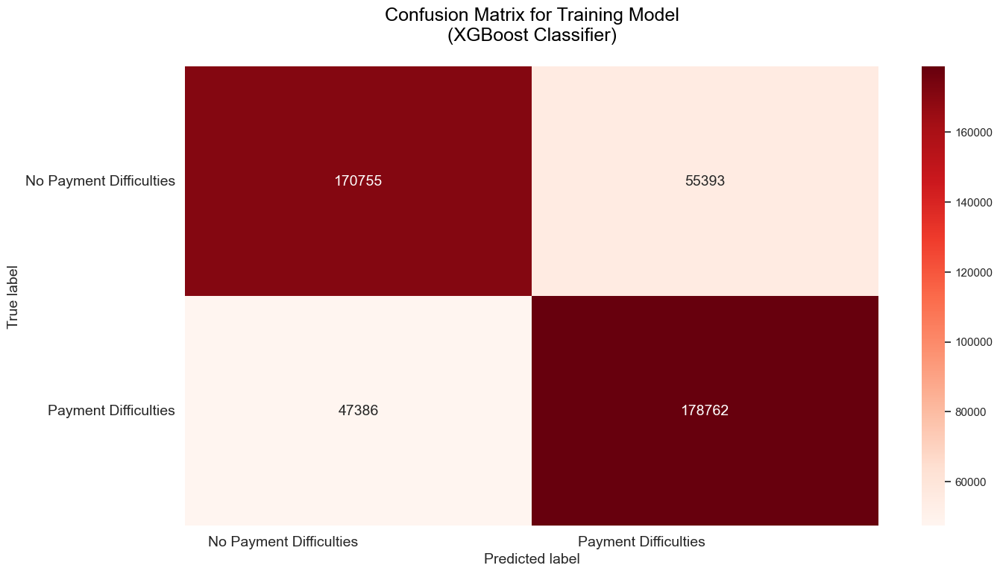

In [144]:
# Form confusion matrix as a dataFrame
confusion_matrix_xgboost = pd.DataFrame((confusion_matrix(y_train, y_train_pred_xgboost)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_xgboost, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Training Model\n(XGBoost Classifier)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Predict Data Validation

In [145]:
y_val_pred_xgboost = xgboost_model.predict(X_val)
print('Classification Report Validating Model (XGBoost Classifier):')
print(classification_report(y_val, y_val_pred_xgboost))

Classification Report Validating Model (XGBoost Classifier):
              precision    recall  f1-score   support

           0       0.95      0.75      0.84     56538
           1       0.17      0.59      0.27      4965

    accuracy                           0.74     61503
   macro avg       0.56      0.67      0.55     61503
weighted avg       0.89      0.74      0.79     61503



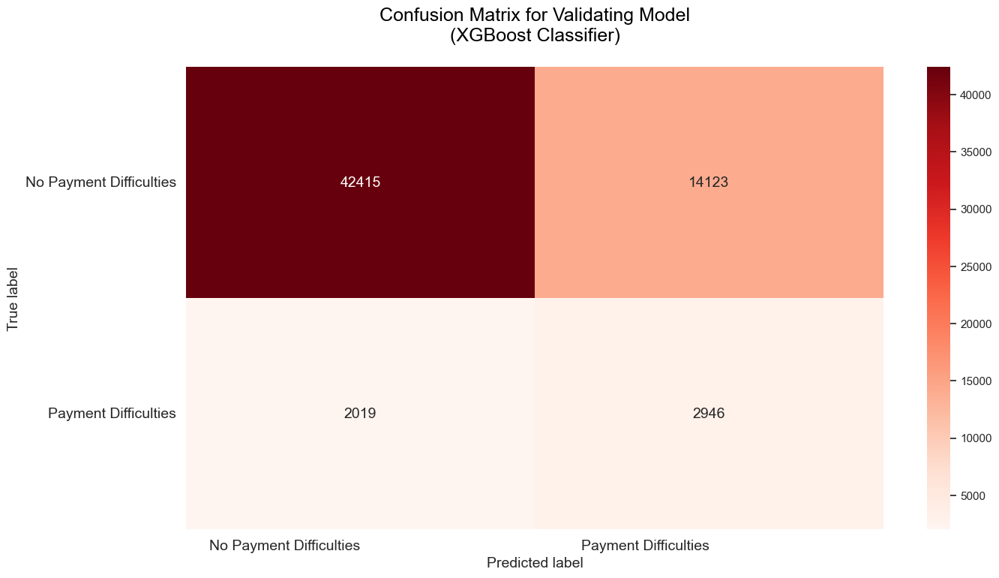

In [146]:
# Form confusion matrix as a dataFrame
confusion_matrix_xgboost = pd.DataFrame((confusion_matrix(y_val, y_val_pred_xgboost)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_xgboost, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Validating Model\n(XGBoost Classifier)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Model Performance

In [148]:
# Recall
recall_train = recall_score(y_train, y_train_pred_xgboost)
print(f'Recall Train: {round(recall_train, 2)}')
recall_val = recall_score(y_val, y_val_pred_xgboost, average='weighted')
print(f'Recall Validation: {round(recall_val, 2)}', end='\n\n')

# Precision
precision_train = precision_score(y_train, y_train_pred_xgboost)
print(f'Precision Train: {round(precision_train, 2)}')
precision_val = precision_score(y_val, y_val_pred_xgboost, average='weighted')
print(f'Precision Validation: {round(precision_val, 2)}', end='\n\n')

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred_xgboost)
print(f'Accuracy Train: {round(accuracy_train, 2)}')
accuracy_val = accuracy_score(y_val, y_val_pred_xgboost)
print(f'Accuracy Validation: {round(accuracy_val, 2)}')

Recall Train: 0.79
Recall Validation: 0.74

Precision Train: 0.76
Precision Validation: 0.89

Accuracy Train: 0.77
Accuracy Validation: 0.74


ROC AUC (Train): 0.77
ROC AUC (Validation): 0.67


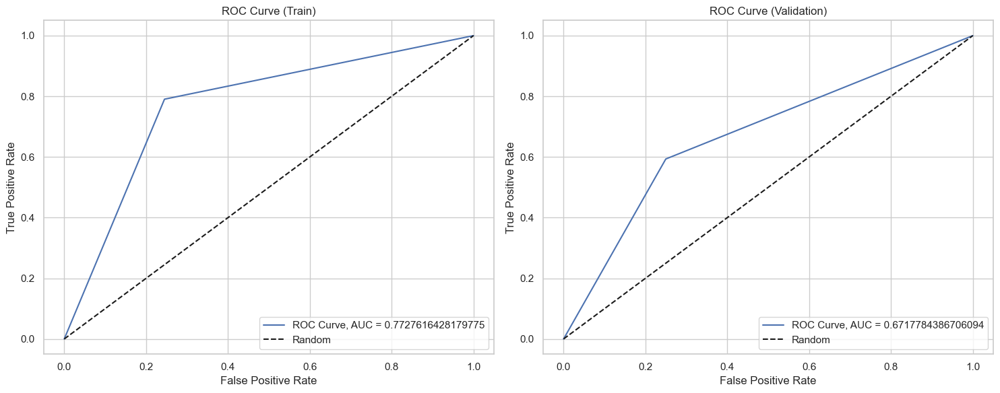

In [149]:
# ROC AUC (Train)
roc_auc_train = roc_auc_score(y_train, y_train_pred_xgboost)
print(f'ROC AUC (Train): {round(roc_auc_train, 2)}')
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_xgboost) # ROC Curve (Train)

# ROC AUC (Validation)
roc_auc_val = roc_auc_score(y_val, y_val_pred_xgboost)
print(f'ROC AUC (Validation): {round(roc_auc_val, 2)}')
fpr_val, tpr_val, thresholds_val = roc_curve(y_val, y_val_pred_xgboost) # ROC Curve (Validation)

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plot_roc_curve(fpr_train, tpr_train, roc_auc_train, 'ROC Curve (Train)')
plt.subplot(1, 2, 2)
plot_roc_curve(fpr_val, tpr_val, roc_auc_val, 'ROC Curve (Validation)')
plt.tight_layout()
plt.show()

### Gradient Boosting Classifier

In [219]:
gb_model = GradientBoostingClassifier().fit(X_train, y_train)
print(gb_model)

GradientBoostingClassifier()


#### Predict Data Train

In [151]:
y_train_pred_gb = gb_model.predict(X_train)
print('Classification Report Training Model (Gradient Boosting Classifier):')
print(classification_report(y_train, y_train_pred_gb))

Classification Report Training Model (Gradient Boosting Classifier):
              precision    recall  f1-score   support

           0       0.69      0.69      0.69    226148
           1       0.69      0.69      0.69    226148

    accuracy                           0.69    452296
   macro avg       0.69      0.69      0.69    452296
weighted avg       0.69      0.69      0.69    452296



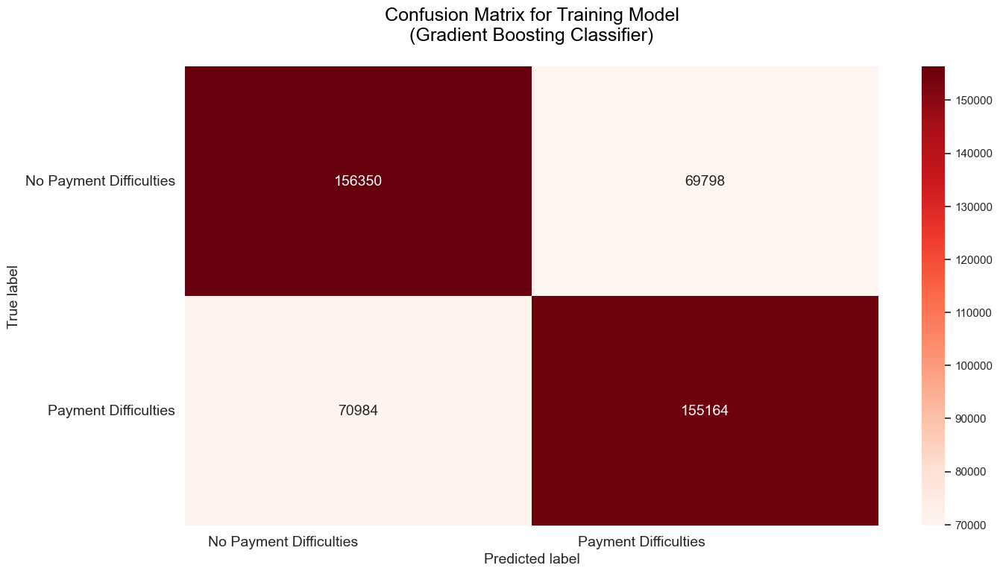

In [152]:
# Form confusion matrix as a dataFrame
confusion_matrix_gb = pd.DataFrame((confusion_matrix(y_train, y_train_pred_gb)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_gb, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Training Model\n(Gradient Boosting Classifier)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Predict Data Validation

In [153]:
y_val_pred_gb = gb_model.predict(X_val)
print('Classification Report Validating Model (Gradient Boosting Classifier):')
print(classification_report(y_val, y_val_pred_gb))

Classification Report Validating Model (Gradient Boosting Classifier):
              precision    recall  f1-score   support

           0       0.96      0.69      0.80     56538
           1       0.16      0.68      0.26      4965

    accuracy                           0.69     61503
   macro avg       0.56      0.69      0.53     61503
weighted avg       0.90      0.69      0.76     61503



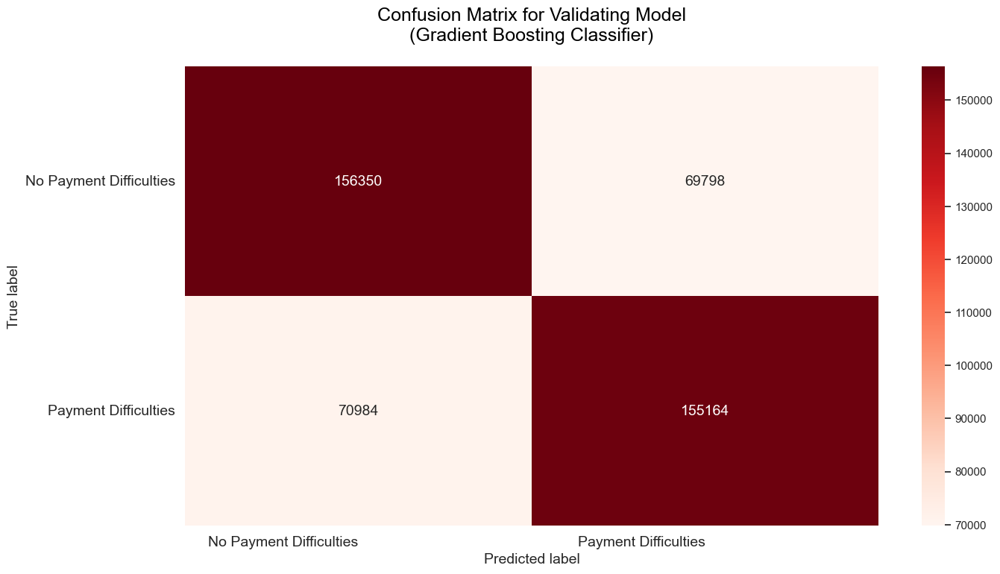

In [154]:
# Form confusion matrix as a dataFrame
confusion_matrix_gb_val = pd.DataFrame((confusion_matrix(y_val, y_val_pred_gb)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_gb, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Validating Model\n(Gradient Boosting Classifier)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

#### Model Performance

In [155]:
# Recall
recall_train = recall_score(y_train, y_train_pred_gb)
print(f'Recall Train: {round(recall_train, 2)}')
recall_val = recall_score(y_val, y_val_pred_gb, average='weighted')
print(f'Recall Validation: {round(recall_val, 2)}', end='\n\n')

# Precision
precision_train = precision_score(y_train, y_train_pred_gb)
print(f'Precision Train: {round(precision_train, 2)}')
precision_val = precision_score(y_val, y_val_pred_gb, average='weighted')
print(f'Precision Validation: {round(precision_val, 2)}', end='\n\n')

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred_gb)
print(f'Accuracy Train: {round(accuracy_train, 2)}')
accuracy_val = accuracy_score(y_val, y_val_pred_gb)
print(f'Accuracy Validation: {round(accuracy_val, 2)}')

Recall Train: 0.69
Recall Validation: 0.69

Precision Train: 0.69
Precision Validation: 0.9

Accuracy Train: 0.69
Accuracy Validation: 0.69


ROC AUC (Train): 0.69
ROC AUC (Validation): 0.67


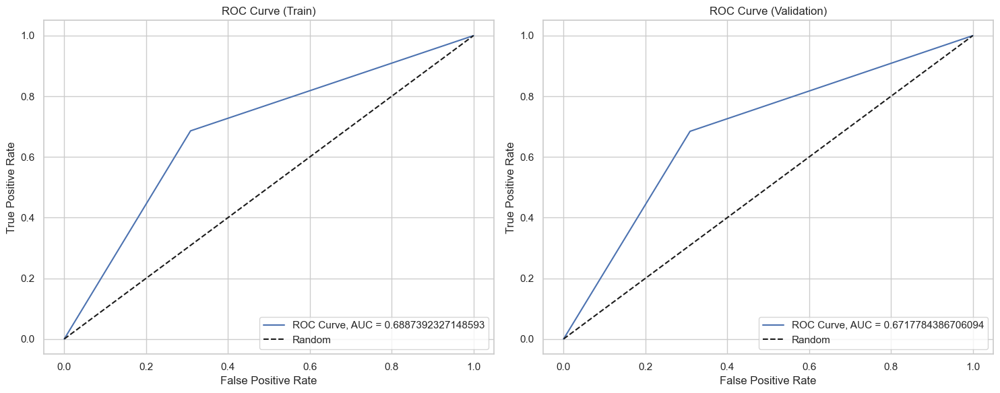

In [156]:
# ROC AUC (Train)
roc_auc_train = roc_auc_score(y_train, y_train_pred_gb)
print(f'ROC AUC (Train): {round(roc_auc_train, 2)}')
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_gb) # ROC Curve (Train)

# ROC AUC (Validation)
roc_auc_val = roc_auc_score(y_val, y_val_pred_xgboost)
print(f'ROC AUC (Validation): {round(roc_auc_val, 2)}')
fpr_val, tpr_val, thresholds_val = roc_curve(y_val, y_val_pred_gb) # ROC Curve (Validation)

plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plot_roc_curve(fpr_train, tpr_train, roc_auc_train, 'ROC Curve (Train)')
plt.subplot(1, 2, 2)
plot_roc_curve(fpr_val, tpr_val, roc_auc_val, 'ROC Curve (Validation)')
plt.tight_layout()
plt.show()

### Each Model's Performance

In [3]:
data = [["Adaboost Classifier", 0.68, 0.69, 0.68, 0.9, 0.68, 0.69, 0.68, 0.68], 
        ["Decision Tree", 1.0, 0.86, 1.0, 0.86, 1.0, 0.66, 1.0, 0.54], 
        ["Gradient Boosting Classifier", 0.69, 0.69, 0.69, 0.9, 0.69, 0.69, 0.69, 0.67],
        ["Logistic Regression", 0.48, 0.66, 0.59, 0.87, 0.58, 0.66, 0.58, 0.57],
        ["Random Forest", 1.0, 0.92, 1.0, 0.88, 1.0, 0.92, 1.0, 0.51],
        ["XGBoost Classifier", 0.79, 0.74, 0.76, 0.89, 0.77, 0.74, 0.77, 0.67]]

columns = ['Models', 'Recall (Train)', 'Recall (Val)', 'Precision (Train)', 'Precision (Val)', 'Accuracy (Train)', 'Accuracy (Val)', 'ROC AUC (Train)', 'ROC AUC (Val)']

results = pd.DataFrame(data, columns=columns)
# results = results.reset_index(drop=True)  # Reset the index
results.sort_values(by=['Models']).style.background_gradient(cmap='Reds')

,Models,Recall (Train),Recall (Val),Precision (Train),Precision (Val),Accuracy (Train),Accuracy (Val),ROC AUC (Train),ROC AUC (Val)
0,Adaboost Classifier,0.680000,0.690000,0.680000,0.900000,0.680000,0.690000,0.680000,0.680000
1,Decision Tree,1.000000,0.860000,1.000000,0.860000,1.000000,0.660000,1.000000,0.540000
2,Gradient Boosting Classifier,0.690000,0.690000,0.690000,0.900000,0.690000,0.690000,0.690000,0.670000
3,Logistic Regression,0.480000,0.660000,0.590000,0.870000,0.580000,0.660000,0.580000,0.570000
4,Random Forest,1.000000,0.920000,1.000000,0.880000,1.000000,0.920000,1.000000,0.510000
5,XGBoost Classifier,0.790000,0.740000,0.760000,0.890000,0.770000,0.740000,0.770000,0.670000


**Summary:** The model with the best and consistently good performance is `Random Forest`. Therefore, predictions for clients with payment difficulties and without payment difficulties on the test data will be conducted using the `Random Forest` model.

### Testing Model with Full Training Dataset 

In [81]:
y_tot_pred_rf = rf_model.predict(X_tot)
print('Classification Report Testing Model (Random Forest):')
print(classification_report(y_tot, y_tot_pred_rf))

Classification Report Testing Model (Random Forest):
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99    282686
         1.0       0.99      0.81      0.89     24825

    accuracy                           0.98    307511
   macro avg       0.99      0.90      0.94    307511
weighted avg       0.98      0.98      0.98    307511



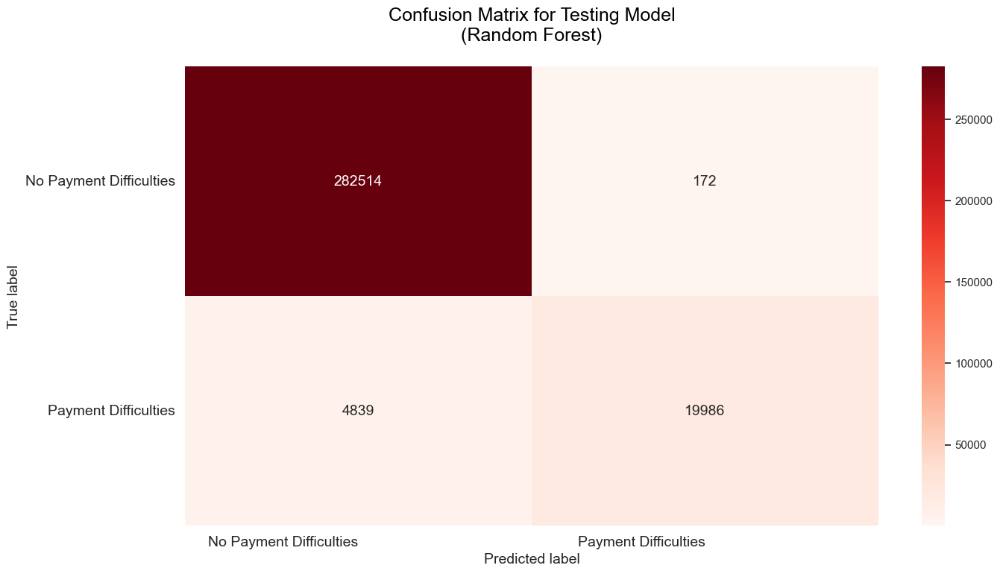

In [82]:
# Form confusion matrix as a dataFrame
confusion_matrix_rf = pd.DataFrame((confusion_matrix(y_tot, y_tot_pred_rf)), ('No Payment Difficulties', 'Payment Difficulties'), ('No Payment Difficulties', 'Payment Difficulties'))

# Plot confusion matrix
plt.figure()
heatmap = sns.heatmap(confusion_matrix_rf, annot=True, annot_kws={'size': 14}, fmt='d', cmap='Reds')
heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)
heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=0, ha='right', fontsize=14)

plt.title('Confusion Matrix for Testing Model\n(Random Forest)\n', fontsize=18, color='black')
plt.ylabel('True label', fontsize=14)
plt.xlabel('Predicted label', fontsize=14)
plt.show()

In [84]:
# Recall
recall_train = recall_score(y_train, y_train_pred_rf)
print(f'Recall Train: {round(recall_train, 2)}')
recall_test = recall_score(y_tot, y_tot_pred_rf)
print(f'Recall Test: {round(recall_test, 2)}', end='\n\n')

# Precision
precision_train = precision_score(y_train, y_train_pred_rf)
print(f'Precision Train: {round(precision_train, 2)}')
precision_test = precision_score(y_tot, y_tot_pred_rf)
print(f'Precision Test: {round(precision_test, 2)}', end='\n\n')

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred_rf)
print(f'Accuracy Train: {round(accuracy_train, 2)}')
accuracy_test = accuracy_score(y_tot, y_tot_pred_rf)
print(f'Accuracy Test: {round(accuracy_test, 2)}')

Recall Train: 1.0
Recall Test: 0.81

Precision Train: 1.0
Precision Test: 0.99

Accuracy Train: 1.0
Accuracy Test: 0.98


### Feature Importance

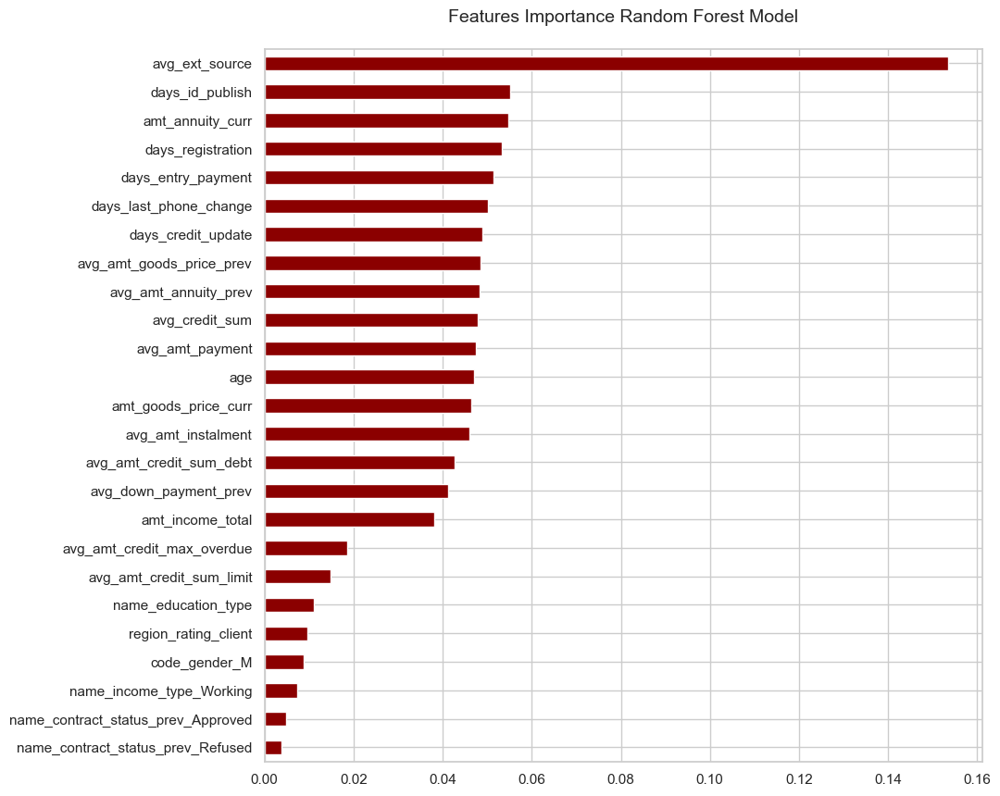

In [44]:
importances_adaboost = pd.Series(rf_model.feature_importances_, index=X_train.columns).sort_values(ascending=True)

# plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(10, 10))
fig = importances_adaboost.plot(kind='barh', color='darkred')
plt.title('Features Importance Random Forest Model\n', fontsize=14)
plt.show()

### Recommendations

#### Based on `avg_ext_source`

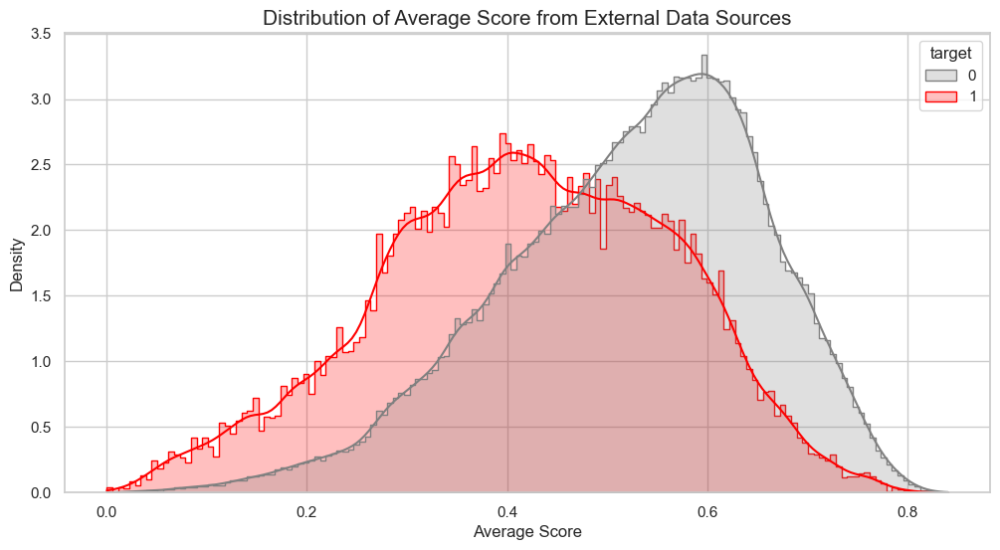

In [50]:
plt.figure(figsize=(12, 6))
plot = sns.histplot(data=X_train, x='avg_ext_source', hue=y_train, element='step', common_norm=False, stat='density', kde=True,
                    palette={0: 'grey', 1: 'red'})
plt.xlabel('Average Score')
plt.ylabel('Density')
plt.title('Distribution of Average Score from External Data Sources', fontsize=15)
plt.show()

**Insight:**
- Clients with payment difficulties tend to have an average score from external sources that starts from 0, gradually increases up to 0.4, and then decreases beyond 0.4. Therefore, a <b>recommendation</b> could be to <b>only consider clients with an average score from external sources greater than 0.4</b>.

#### Based on `days_id_publish`

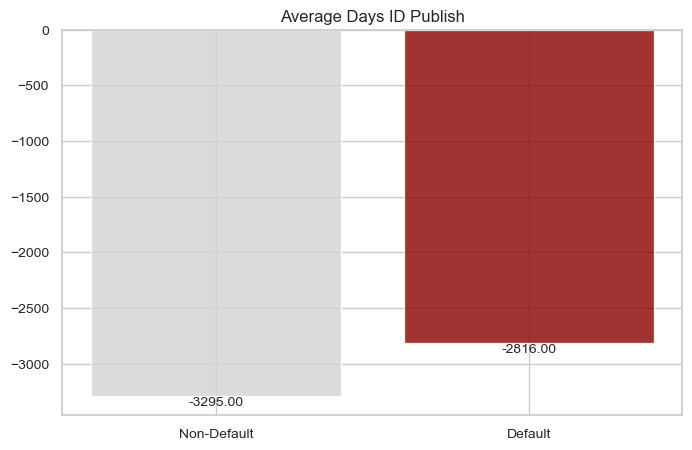

In [52]:
plt.figure(figsize=(8, 5))

target_0 = df_upsampled[df_upsampled['target'] == 0]
target_1 = df_upsampled[df_upsampled['target'] == 1]

bar_width = 0.1
index = [0, 1]
plt.bar(index, [target_0['days_id_publish'].median(), target_1['days_id_publish'].median()],
        color=['lightgrey', 'darkred'], alpha=0.8, label='Days ID Publish')

for i, label in zip(index, [target_0['days_id_publish'].median(), target_1['days_id_publish'].median()]):
    plt.text(i, label, f'{label:.2f}', ha='center', va='top', fontsize=10)

#plt.ylabel('Amount Income', fontsize=12)
plt.title('Average Days ID Publish')
plt.xticks(index, ['Non-Default', 'Default'], fontsize=10)
plt.yticks(fontsize=10)
plt.show()

**Insight:**
- Clients facing payment difficulties show an average turnover of more recent identification documents, approximately 2816 days or around 7 years since loan application. Hence, it is <b>recommended</b> to <b>implement a rule specifying a maximum document turnover of 9 years</b>, as observed in the average for non-default cases. This is also intended to assess clients' preparedness when applying for loans.

#### Based on `amt_annuity_curr`

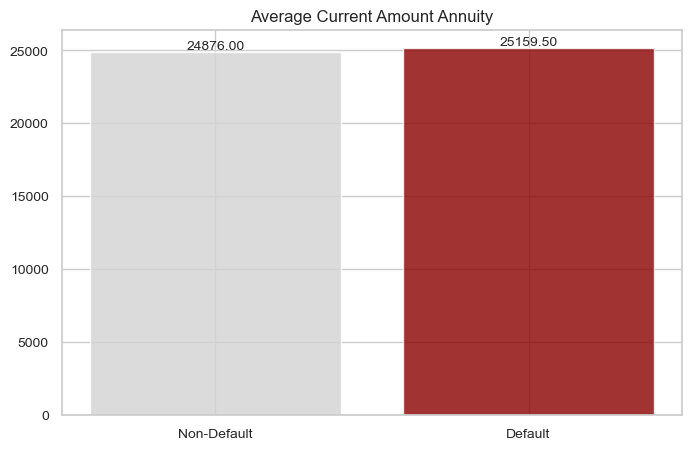

In [55]:
plt.figure(figsize=(8, 5))

target_0 = df_upsampled[df_upsampled['target'] == 0]
target_1 = df_upsampled[df_upsampled['target'] == 1]

bar_width = 0.1
index = [0, 1]
plt.bar(index, [target_0['amt_annuity_curr'].median(), target_1['amt_annuity_curr'].median()],
        color=['lightgrey', 'darkred'], alpha=0.8, label='Current Amt Annuity')

for i, label in zip(index, [target_0['amt_annuity_curr'].median(), target_1['amt_annuity_curr'].median()]):
    plt.text(i, label, f'{label:.2f}', ha='center', va='bottom', fontsize=10)

#plt.ylabel('Amount Income', fontsize=12)
plt.title('Average Current Amount Annuity')
plt.xticks(index, ['Non-Default', 'Default'], fontsize=10)
plt.yticks(fontsize=10)
plt.show()

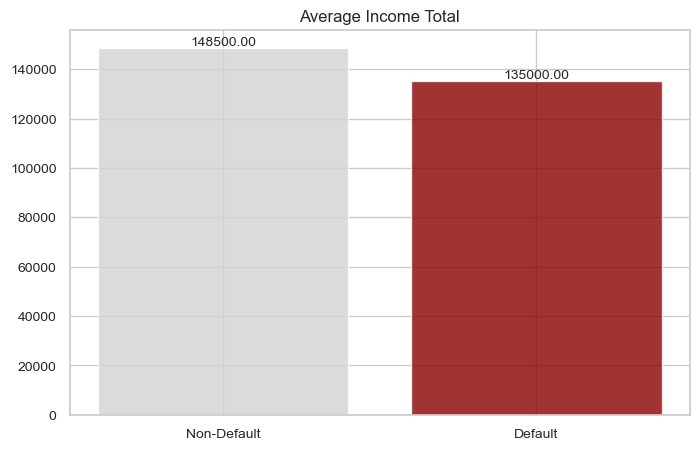

In [56]:
plt.figure(figsize=(8, 5))

target_0 = df_upsampled[df_upsampled['target'] == 0]
target_1 = df_upsampled[df_upsampled['target'] == 1]

bar_width = 0.1
index = [0, 1]
plt.bar(index, [target_0['amt_income_total'].median(), target_1['amt_income_total'].median()],
        color=['lightgrey', 'darkred'], alpha=0.8, label='Amt Income Total')

for i, label in zip(index, [target_0['amt_income_total'].median(), target_1['amt_income_total'].median()]):
    plt.text(i, label, f'{label:.2f}', ha='center', va='bottom', fontsize=10)

#plt.ylabel('Amount Income', fontsize=12)
plt.title('Average Income Total')
plt.xticks(index, ['Non-Default', 'Default'], fontsize=10)
plt.yticks(fontsize=10)
plt.show()

**Insight:**
- Clients who struggle with payment difficulties are burdened with higher annuity payments than those who do not face payment challenges, despite having a lower total income. As a <b>recommendation</b>, it would be <b>prudent to evaluate and adjust the annuity amounts for clients facing payment difficulties (if necessary)</b>. This adjustment aims to align the annuity obligations with their financial capacity, ultimately reducing the risk of payment defaults.

#### Based on `days_registration`

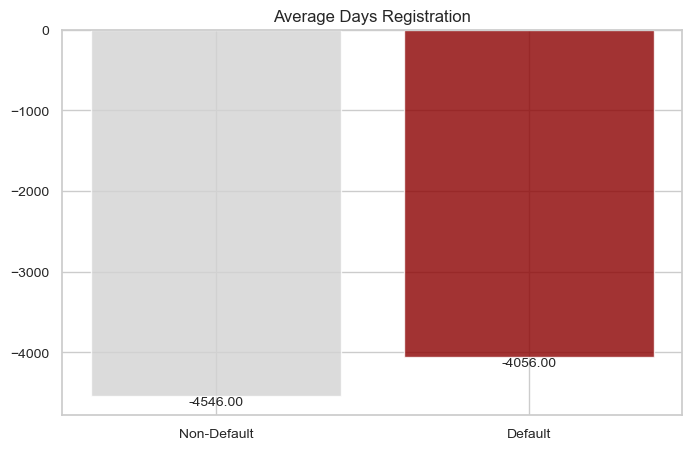

In [57]:
plt.figure(figsize=(8, 5))

target_0 = df_upsampled[df_upsampled['target'] == 0]
target_1 = df_upsampled[df_upsampled['target'] == 1]

bar_width = 0.1
index = [0, 1]
plt.bar(index, [target_0['days_registration'].median(), target_1['days_registration'].median()],
        color=['lightgrey', 'darkred'], alpha=0.8, label='Days Registration')

for i, label in zip(index, [target_0['days_registration'].median(), target_1['days_registration'].median()]):
    plt.text(i, label, f'{label:.2f}', ha='center', va='top', fontsize=10)

#plt.ylabel('Amount Income', fontsize=12)
plt.title('Average Days Registration')
plt.xticks(index, ['Non-Default', 'Default'], fontsize=10)
plt.yticks(fontsize=10)
plt.show()

**Insight:**
- Clients who experience payment difficulties tend to change their registration 4056 days/11 years before submitting their application. Hence, it is <b>recommended</b> to <b>implement a rule specifying a maximum registration change before submitting the application of 12 years</b>, as observed in the average for non-default cases.

#### Based on `days_entry_payment`

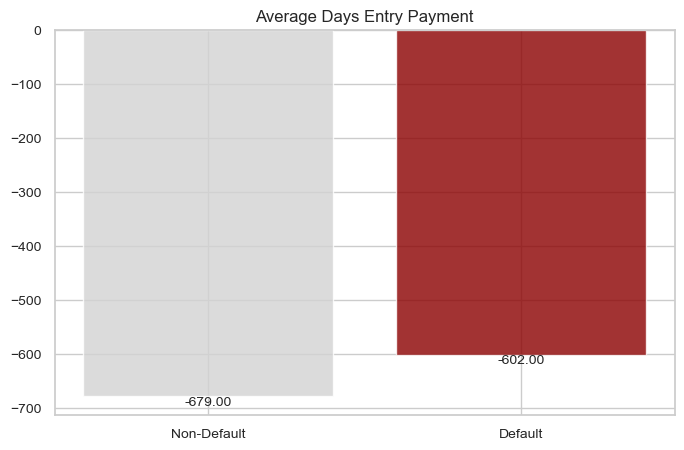

In [58]:
plt.figure(figsize=(8, 5))

target_0 = df_upsampled[df_upsampled['target'] == 0]
target_1 = df_upsampled[df_upsampled['target'] == 1]

bar_width = 0.1
index = [0, 1]
plt.bar(index, [target_0['days_entry_payment'].median(), target_1['days_entry_payment'].median()],
        color=['lightgrey', 'darkred'], alpha=0.8, label='Days Entry Payment')

for i, label in zip(index, [target_0['days_entry_payment'].median(), target_1['days_entry_payment'].median()]):
    plt.text(i, label, f'{label:.2f}', ha='center', va='top', fontsize=10)

#plt.ylabel('Amount Income', fontsize=12)
plt.title('Average Days Entry Payment')
plt.xticks(index, ['Non-Default', 'Default'], fontsize=10)
plt.yticks(fontsize=10)
plt.show()

**Insight:**
- Clients who experience payment difficulties tend to make payments for more recent installments of the previous credit (602 days/1.6 years) compared to clients who do not face payment challenges (679 days/1.8 years). Hence, it is <b>recommended</b> to <b>implement a rule specifying a maximum payment for the previous credit installment within a maximum of 1.8 years prior</b>, as observed in the average for non-default cases.

### Predictions

In [85]:
# Check the contents of the testing dataset
df_test.sample()

,flag_own_car,flag_own_realty,cnt_children,amt_income_total,amt_credit_curr,amt_annuity_curr,amt_goods_price_curr,name_education_type,days_employed,days_registration,days_id_publish,cnt_fam_members,region_rating_client,days_last_phone_change,avg_credit_day_overdue,days_credit_enddate,avg_amt_credit_max_overdue,avg_credit_prolong,avg_credit_sum,avg_amt_credit_sum_debt,avg_amt_credit_sum_limit,avg_amt_credit_sum_overdue,days_credit_update,avg_amt_annuity_prev,avg_down_payment_prev,avg_amt_goods_price_prev,num_instalment_version,num_instalment_number,days_instalment,days_entry_payment,avg_amt_instalment,avg_amt_payment,months_balance_pos,cnt_instalment_future,sk_dpd_pos,sk_dpd_def_pos,months_balance_cc,age,avg_ext_source,name_contract_type_curr_Cash loans,name_contract_type_curr_Revolving loans,code_gender_F,code_gender_M,name_income_type_Businessman,name_income_type_Commercial associate,name_income_type_Pensioner,name_income_type_State servant,name_income_type_Student,name_income_type_Unemployed,name_income_type_Working,name_family_status_Married,name_family_status_Single / not married,name_family_status_Widow,name_housing_type_Co-op apartment,name_housing_type_House / apartment,name_housing_type_Municipal apartment,name_housing_type_Office apartment,name_housing_type_Rented apartment,name_housing_type_With parents,occupation_type_Accountants,occupation_type_Cleaning staff,occupation_type_Cooking staff,occupation_type_Core staff,occupation_type_Drivers,occupation_type_HR staff,occupation_type_High skill tech staff,occupation_type_IT staff,occupation_type_Laborers,occupation_type_Low-skill Laborers,occupation_type_Managers,occupation_type_Medicine staff,occupation_type_Private service staff,occupation_type_Realty agents,occupation_type_Sales staff,occupation_type_Secretaries,occupation_type_Security staff,occupation_type_Waiters/barmen staff,organization_type_Advertising,organization_type_Agriculture,organization_type_Bank,organization_type_Business entity,organization_type_Cleaning,organization_type_Construction,organization_type_Culture,organization_type_Electricity,organization_type_Emergency,organization_type_Government,organization_type_Hotel,organization_type_Housing,organization_type_Industry,organization_type_Insurance,organization_type_Kindergarten,organization_type_Legal Services,organization_type_Medicine,organization_type_Military,organization_type_Mobile,organization_type_Other,organization_type_Police,organization_type_Postal,organization_type_Realtor,organization_type_Religion,organization_type_Restaurant,organization_type_School,organization_type_Security,organization_type_Security Ministries,organization_type_Self-employed,organization_type_Services,organization_type_Telecom,organization_type_Trade,organization_type_Transport,organization_type_University,credit_bureau_active_Active,credit_bureau_active_Bad debt,credit_bureau_active_Closed,credit_bureau_active_Sold,credit_type_Another type of loan,credit_type_Car loan,credit_type_Cash loan (non-earmarked),credit_type_Consumer credit,credit_type_Credit card,credit_type_Loan for business development,credit_type_Loan for working capital replenishment,credit_type_Microloan,credit_type_Mortgage,credit_type_Real estate loan,name_contract_type_prev_Cash loans,name_contract_type_prev_Consumer loans,name_contract_type_prev_Revolving loans,name_contract_status_prev_Approved,name_contract_status_prev_Canceled,name_contract_status_prev_Refused,name_contract_status_prev_Unused offer,name_portfolio_prev_Cards,name_portfolio_prev_Cars,name_portfolio_prev_Cash,name_portfolio_prev_Other,name_portfolio_prev_POS,name_contract_status_pos_Active,name_contract_status_pos_Amortized debt,name_contract_status_pos_Approved,name_contract_status_pos_Completed,name_contract_status_pos_Demand,name_contract_status_pos_Returned to the store,name_contract_status_pos_Signed
23970,1,0,0.00,225000.00,360000.00,18405.00,360000.00,1,-2981.00,-190.00,-893.00,2.00,2.00,-2059.00,0.00,-2245.00,11720.32,0.

In [102]:
# Identifying features to be used for prediction based on the features in the training data
pred_test = df_test[final_feature]
pred_test.sample(3)

,avg_ext_source,age,region_rating_client,days_last_phone_change,name_income_type_Working,name_education_type,code_gender_M,name_contract_status_prev_Refused,name_contract_status_prev_Approved,avg_credit_sum,amt_income_total,avg_amt_credit_max_overdue,avg_amt_credit_sum_debt,avg_amt_goods_price_prev,amt_goods_price_curr,avg_amt_credit_sum_limit,avg_amt_instalment,avg_amt_payment,avg_amt_annuity_prev,avg_down_payment_prev,amt_annuity_curr,days_registration,days_id_publish,days_credit_update,days_entry_payment
43031,0.53,-36.00,2.00,-2342.00,0,1,0,0,1,85914.34,112500.00,1181.49,20709.49,53995.50,450000.00,0.00,5030.35,5030.35,6212.74,5400.00,19048.50,-769.00,-4831.00,-2302.00,-1544.00
22769,0.39,-33.00,2.00,-436.00,1,1,0,0,1,84635.38,112500.00,0.00,30654.11,84145.50,225000.00,22360.25,18466.03,18466.03,9557.24,0.00,11488.50,-5479.00,-1760.00,-1351.00,-372.00
27449,0.59,-57.00,2.00,-2036.00,0,1,0,0,1,212053.79,105750.00,0.00,7150.95,71550.00,90000.00,0.00,6903.49,6903.49,9632.54,4293.00,10813.50,-13454.00,-3940.00,-551.00,-1691.00


In [105]:
# Changing data type of the target column to integer
df_test['sk_id_curr'] = df_test['sk_id_curr'].astype(int)

In [106]:
# Predict target for the testing dataset
predict = pd.Series(rf_model.predict(pred_test), name = "target").astype(int)
result = pd.concat([df_test['sk_id_curr'], predict],axis = 1)
result.to_csv("predict_application.csv", index = False)
result.sample(10)

,sk_id_curr,target
35792,361975,0
45528,433035,0
15100,208769,0
5732,142036,0
1509,110774,0
9782,171061,0
36893,370012,0
28279,306302,0
27643,301653,0
31358,327962,0


In [107]:
# Check the distribution of the target column
result['target'].value_counts()

0    48623
1      121
Name: target, dtype: int64

**Summary:**
In the testing dataset, there are 121 (0.25%) clients predicted to experience payment difficulties, while the remaining 48,623 (99.75%) clients do not face payment challenges.